## Importing Relevant Dependencies

Most of the code used in this project was adopted from Codebasics YouTube tutorial series (https://youtube.com/playlist?list=PLeo1K3hjS3uu7CxAacxVndI4bE_o3BDtO&si=tsHbeo5xSW1G3OX6 )  and was adapted to meet specific requirement of my project. For code not sourced from Codebasics, references have been included as comments within the respective code blocks.

In [1]:
import matplotlib.pyplot as plt
import numpy as np
import cv2
import os
import PIL
import tensorflow as tf
import random

from tensorflow import keras
from tensorflow.keras import layers, models
from tensorflow.keras.models import Sequential
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications import VGG16
from tensorflow.keras.models import Sequential



2024-07-27 14:37:29.111221: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  SSE4.1 SSE4.2 AVX AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


## Ensuring my GPU is utilized

In [2]:
# Ensure GPU is used if available
physical_devices = tf.config.list_physical_devices('GPU')
if physical_devices:
    try:
        # Enable memory growth on the first GPU
        tf.config.experimental.set_memory_growth(physical_devices[0], True)

        # Print details of available GPUs
        print("Available GPUs:")
        for device in physical_devices:
            print(f"  - Name: {device.name}, Type: {device.device_type}")  
    except RuntimeError as e:
        # Memory growth must be set before GPUs have been initialized
        print(e)
else:
    print("No GPU found. Using CPU instead.")



Available GPUs:
  - Name: /physical_device:GPU:0, Type: GPU


2024-07-27 14:38:15.069115: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:981] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2024-07-27 14:38:17.698582: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:981] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2024-07-27 14:38:17.699330: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:981] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero


### Data path settings and data exploration

In [3]:
import pathlib
data_dir = pathlib.Path('./dataset/original')
data_dir = pathlib.Path(data_dir)
data_dir

PosixPath('dataset/original')

In [4]:
list(data_dir.glob('*/*.jpg'))[:20]

[PosixPath('dataset/original/FoodOrganics/Food Organics_279.jpg'),
 PosixPath('dataset/original/FoodOrganics/Food Organics_257.jpg'),
 PosixPath('dataset/original/FoodOrganics/Food Organics_141.jpg'),
 PosixPath('dataset/original/FoodOrganics/Food Organics_270.jpg'),
 PosixPath('dataset/original/FoodOrganics/Food Organics_50.jpg'),
 PosixPath('dataset/original/FoodOrganics/Food Organics_319.jpg'),
 PosixPath('dataset/original/FoodOrganics/Food Organics_295.jpg'),
 PosixPath('dataset/original/FoodOrganics/Food Organics_113.jpg'),
 PosixPath('dataset/original/FoodOrganics/Food Organics_90.jpg'),
 PosixPath('dataset/original/FoodOrganics/Food Organics_380.jpg'),
 PosixPath('dataset/original/FoodOrganics/Food Organics_410.jpg'),
 PosixPath('dataset/original/FoodOrganics/Food Organics_405.jpg'),
 PosixPath('dataset/original/FoodOrganics/Food Organics_130.jpg'),
 PosixPath('dataset/original/FoodOrganics/Food Organics_354.jpg'),
 PosixPath('dataset/original/FoodOrganics/Food Organics_387.jpg'

## Exploring the Data

In [5]:
image_count = len(list(data_dir.glob('*/*.jpg')))
print(image_count)

4752


In [6]:
cardboard = list(data_dir.glob('Cardboard/*'))
cardboard[:5]

[PosixPath('dataset/original/Cardboard/Cardboard_301.jpg'),
 PosixPath('dataset/original/Cardboard/Cardboard_434.jpg'),
 PosixPath('dataset/original/Cardboard/Cardboard_410.jpg'),
 PosixPath('dataset/original/Cardboard/Cardboard_209.jpg'),
 PosixPath('dataset/original/Cardboard/Cardboard_1.jpg')]

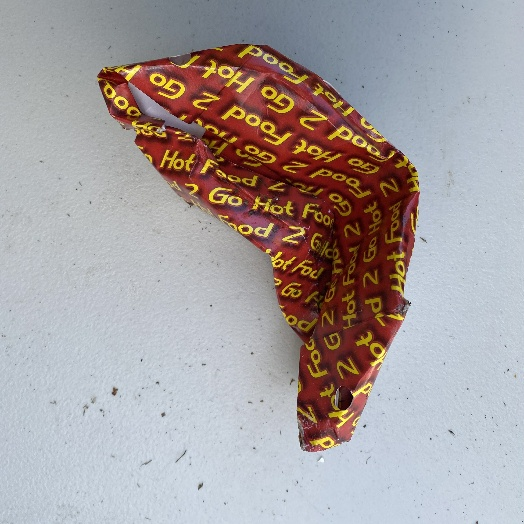

In [7]:
PIL.Image.open(str(cardboard[40]))

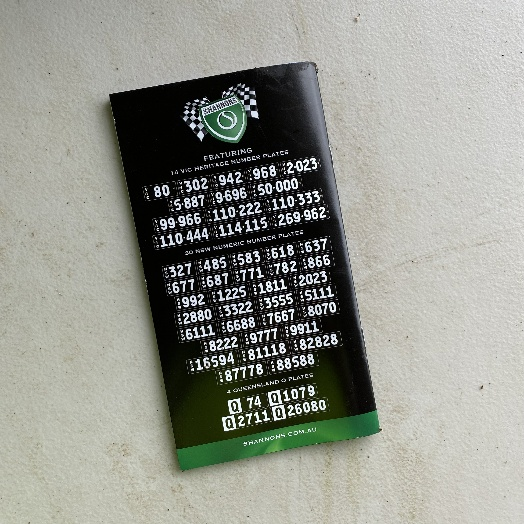

In [8]:
paper = list(data_dir.glob('Paper/*'))
PIL.Image.open(str(paper[60]))

### Take the images from directory and saving them into python Dictionary for ease of processing

In [9]:
# code sourced from codebasics https://youtube.com/playlist?list=PLeo1K3hjS3uu7CxAacxVndI4bE_o3BDtO&si=tsHbeo5xSW1G3OX6 
waste_images_dict = {
    'cardboard': list(data_dir.glob('Cardboard/*')),
    'food_organics': list(data_dir.glob('FoodOrganics/*')),
    'glass': list(data_dir.glob('Glass/*')),
    'metal': list(data_dir.glob('Metal/*')),
    'misc_Trash': list(data_dir.glob('MiscellaneousTrash/*')),
    'paper': list(data_dir.glob('Paper/*')),
    'plastic': list(data_dir.glob('Plastic/*')),
    'textile': list(data_dir.glob('TextileTrash/*')),
    'vegetation': list(data_dir.glob('Vegetation/*')),
}

### Converting the Text Labels into Numerical values

In [10]:
waste_image_labels = {
    'cardboard': 0,
    'food_organics':1,
    'glass': 2,
    'metal': 3,
    'misc_Trash':4,
    'paper': 5,
    'plastic':6,
    'textile':7,
    'vegetation':8,
}

### Testing and checking out Open CV converting to numpy array only on the First image in the Cardboard Category

In [11]:
img = cv2.imread(str(waste_images_dict['cardboard'][0]))
img

array([[[209, 176, 156],
        [209, 176, 156],
        [208, 177, 156],
        ...,
        [167, 137, 120],
        [165, 137, 120],
        [165, 137, 120]],

       [[211, 178, 158],
        [211, 178, 158],
        [210, 179, 158],
        ...,
        [168, 138, 121],
        [166, 138, 121],
        [166, 138, 121]],

       [[210, 177, 157],
        [210, 177, 157],
        [209, 178, 157],
        ...,
        [168, 138, 121],
        [165, 137, 120],
        [166, 138, 121]],

       ...,

       [[227, 200, 179],
        [226, 199, 178],
        [227, 200, 179],
        ...,
        [132, 123, 110],
        [133, 124, 111],
        [133, 124, 111]],

       [[228, 201, 180],
        [227, 200, 179],
        [229, 202, 181],
        ...,
        [132, 123, 110],
        [134, 125, 112],
        [134, 125, 112]],

       [[228, 201, 180],
        [227, 200, 179],
        [229, 202, 181],
        ...,
        [133, 124, 111],
        [134, 125, 112],
        [134, 125, 112]]

#### Checking number of Images in each category

In [12]:
for waste_name, images in waste_images_dict.items():
    print(waste_name)
    print(len(images))
    

cardboard
461
food_organics
411
glass
420
metal
790
misc_Trash
495
paper
500
plastic
921
textile
318
vegetation
436


### Plot to have an insight of the distribution for each category

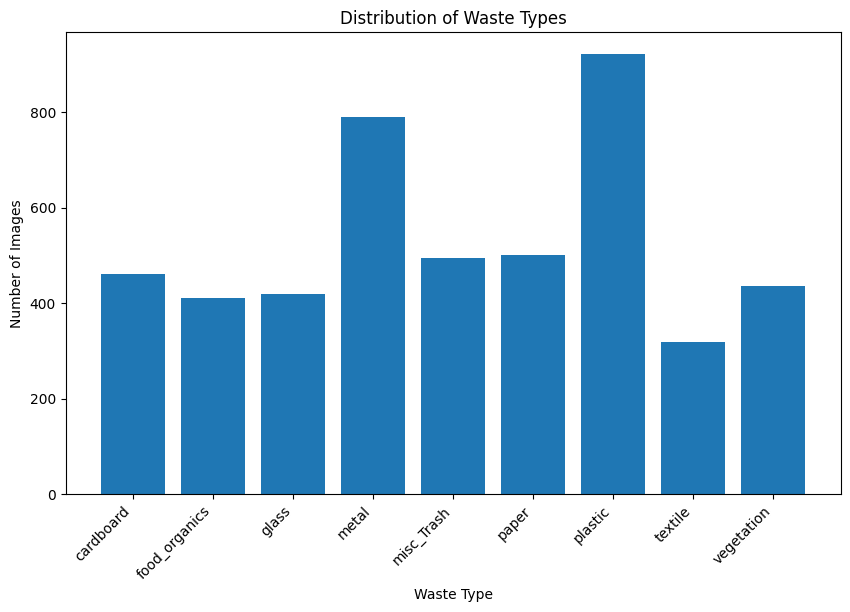

In [13]:
# code sourced from codebasics https://youtube.com/playlist?list=PLeo1K3hjS3uu7CxAacxVndI4bE_o3BDtO&si=tsHbeo5xSW1G3OX6 
# Get waste types and image counts
waste_types = list(waste_images_dict.keys())
image_counts = [len(images) for images in waste_images_dict.values()]

# Create and display bar plot
plt.figure(figsize=(10, 6))
plt.bar(waste_types, image_counts)
plt.xlabel('Waste Type')
plt.ylabel('Number of Images')
plt.title('Distribution of Waste Types')
plt.xticks(rotation=45, ha="right")  # Rotate x-axis labels for readability
plt.show()


### Resizing the image to 80x80

In [14]:
# code sourced from codebasics https://youtube.com/playlist?list=PLeo1K3hjS3uu7CxAacxVndI4bE_o3BDtO&si=tsHbeo5xSW1G3OX6 
X, y = [], []

for waste_name, images in waste_images_dict.items():
    for image in images:
        img = cv2.imread(str(image))
        resized_img = cv2.resize(img,(80,80))
        X.append(resized_img)
        y.append(waste_image_labels[waste_name])

### Converting them into a numpy Array

In [15]:
X = np.array(X)
y = np.array(y)

### Splitting the Data into Test and Train Set

In [16]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=0)

In [17]:
X_train.shape

(3564, 80, 80, 3)

In [18]:
X_test.shape

(1188, 80, 80, 3)

## Visualising the Training Set

Initial train counts: {'cardboard': 354, 'food_organics': 295, 'glass': 323, 'metal': 578, 'misc_Trash': 385, 'paper': 370, 'plastic': 688, 'textile': 234, 'vegetation': 337}


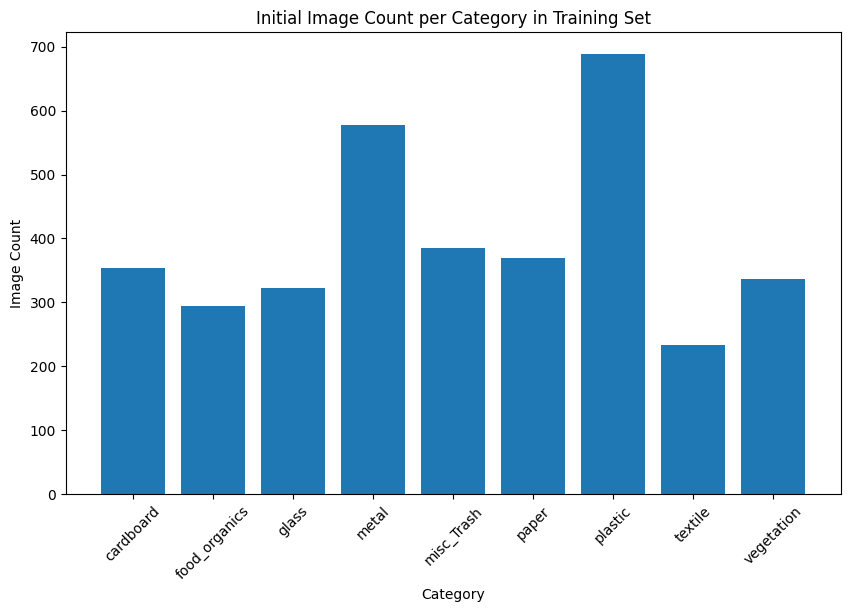

In [19]:
# Ensure y_train is a numpy array
y_train = np.array(y_train)

# Preprocess X_train for faster membership checking
X_train_set = set(tuple(img.flatten()) for img in X_train)

# Calculate initial counts of images per category in the training set
train_counts = {}
for waste_name, images in waste_images_dict.items():
    train_images = [img for img in images if tuple(cv2.resize(cv2.imread(str(img)), (80, 80)).flatten()) in X_train_set]
    train_counts[waste_name] = len(train_images)

print("Initial train counts:", train_counts)

# Display the initial image count per category in X_train
plt.figure(figsize=(10, 6))
plt.bar(train_counts.keys(), train_counts.values())
plt.xlabel('Category')
plt.ylabel('Image Count')
plt.title('Initial Image Count per Category in Training Set')
plt.xticks(rotation=45)
plt.show()

# PERFORMING TRAINING AND VALIDATION WITHOUGH AUGUMENTING THE DATASET

In [19]:
X_train_scaled = X_train/ 255
X_test_scaled = X_test / 255

### VGG16 without Data Augmenting

In [20]:
# code sourced from https://towardsdatascience.com/transfer-learning-with-vgg16-and-keras-50ea161580b4
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau

# Define the model using VGG16 with some trainable layers
input_shape = (80, 80, 3)
base_model = VGG16(weights='imagenet', include_top=False, input_shape=input_shape)

# Unfreeze the top layers of VGG16 for fine-tuning
for layer in base_model.layers[-4:]:
    layer.trainable = True

model = Sequential([
    base_model,
    layers.Flatten(),
    layers.Dense(256, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(0.001)),
    layers.Dropout(0.5),
    layers.Dense(len(waste_image_labels), activation='softmax')
])

# Compile the model
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.001),
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=False),
              metrics=['accuracy'])

# Define callbacks
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=5, min_lr=0.00001)



2024-07-27 13:15:14.355678: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  SSE4.1 SSE4.2 AVX AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-07-27 13:15:14.365768: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:981] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2024-07-27 13:15:14.366229: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:981] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2024-07-27 13:15:14.366583: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:981] successful NUMA node read from SysFS had negative value (-1), but there m

In [21]:
# Train the model with callbacks
model.fit(X_train_scaled, y_train, epochs=100, validation_data=(X_test_scaled, y_test),
          callbacks=[early_stopping, reduce_lr])

Epoch 1/100


2024-07-27 13:15:25.436136: I tensorflow/compiler/xla/stream_executor/cuda/cuda_dnn.cc:428] Loaded cuDNN version 8907
2024-07-27 13:15:28.903079: W tensorflow/compiler/xla/stream_executor/gpu/asm_compiler.cc:115] *** WARNING *** You are using ptxas 10.1.243, which is older than 11.1. ptxas before 11.1 is known to miscompile XLA code, leading to incorrect results or invalid-address errors.

You may not need to update to CUDA 11.1; cherry-picking the ptxas binary is often sufficient.
2024-07-27 13:15:31.645609: I tensorflow/compiler/xla/service/service.cc:173] XLA service 0x7fabc85ef3e0 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
2024-07-27 13:15:31.645660: I tensorflow/compiler/xla/service/service.cc:181]   StreamExecutor device (0): NVIDIA GeForce RTX 2060, Compute Capability 7.5
2024-07-27 13:15:32.136833: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:268] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DI

112/112 [==============================] - 28s 91ms/step - loss: 2.4090 - accuracy: 0.1804 - val_loss: 2.2184 - val_accuracy: 0.1961 - lr: 0.0010
Epoch 2/100
112/112 [==============================] - 8s 74ms/step - loss: 2.1193 - accuracy: 0.2270 - val_loss: 2.0311 - val_accuracy: 0.2753 - lr: 0.0010
Epoch 3/100
112/112 [==============================] - 8s 74ms/step - loss: 1.9760 - accuracy: 0.2932 - val_loss: 1.8938 - val_accuracy: 0.3081 - lr: 0.0010
Epoch 4/100
112/112 [==============================] - 8s 74ms/step - loss: 1.8480 - accuracy: 0.3145 - val_loss: 1.8259 - val_accuracy: 0.3460 - lr: 0.0010
Epoch 5/100
112/112 [==============================] - 8s 74ms/step - loss: 1.7644 - accuracy: 0.3437 - val_loss: 1.6573 - val_accuracy: 0.3830 - lr: 0.0010
Epoch 6/100
112/112 [==============================] - 8s 74ms/step - loss: 1.6439 - accuracy: 0.3911 - val_loss: 1.6114 - val_accuracy: 0.4007 - lr: 0.0010
Epoch 7/100
112/112 [==============================] - 8s 74ms/step -

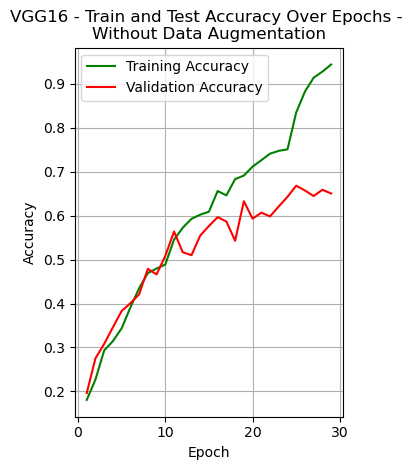

In [20]:
# Data
data = {
    'Epoch': list(range(1, 30)),
    'Training Accuracy': [0.1804, 0.2270, 0.2932, 0.3145, 0.3437, 0.3911, 0.4349, 0.4694, 0.4798, 0.4888, 
                       0.5455, 0.5727, 0.5929, 0.6024, 0.6091, 0.6563, 0.6462, 0.6835, 0.6914, 0.7118,
                       0.7264, 0.7413, 0.7478, 0.7511, 0.8353, 0.8827, 0.9144, 0.9282, 0.9444],
    'Validation Accuracy': [0.1961, 0.2753, 0.3081, 0.3460, 0.3830, 0.4007, 0.4209, 0.4790, 0.4663, 0.5084, 
                     0.5640, 0.5168, 0.5101, 0.5547, 0.5766, 0.5968, 0.5867, 0.5429, 0.6330, 0.5934,
                     0.6069, 0.5985, 0.6212, 0.6431, 0.6684, 0.6574, 0.6448, 0.6591, 0.6507]
}

# Create DataFrame
df = pd.DataFrame(data)

# Plot Accuracy
plt.subplot(1, 2, 2)
plt.plot(df['Epoch'], df['Training Accuracy'], label='Training Accuracy', color='green')
plt.plot(df['Epoch'], df['Validation Accuracy'], label='Validation Accuracy', color='red')
plt.title('VGG16 - Train and Test Accuracy Over Epochs - \nWithout Data Augmentation')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()


38/38 - 1s - loss: 1.0740 - accuracy: 0.6330 - 785ms/epoch - 21ms/step

Test accuracy: 0.6329966187477112
38/38 [==============================] - 1s 19ms/step
               precision    recall  f1-score   support

    cardboard       0.65      0.68      0.67       107
food_organics       0.68      0.71      0.69       116
        glass       0.76      0.68      0.72        97
        metal       0.65      0.58      0.61       212
   misc_Trash       0.40      0.42      0.41       110
        paper       0.65      0.58      0.61       130
      plastic       0.63      0.70      0.66       233
      textile       0.46      0.43      0.44        84
   vegetation       0.77      0.91      0.83        99

     accuracy                           0.63      1188
    macro avg       0.63      0.63      0.63      1188
 weighted avg       0.63      0.63      0.63      1188



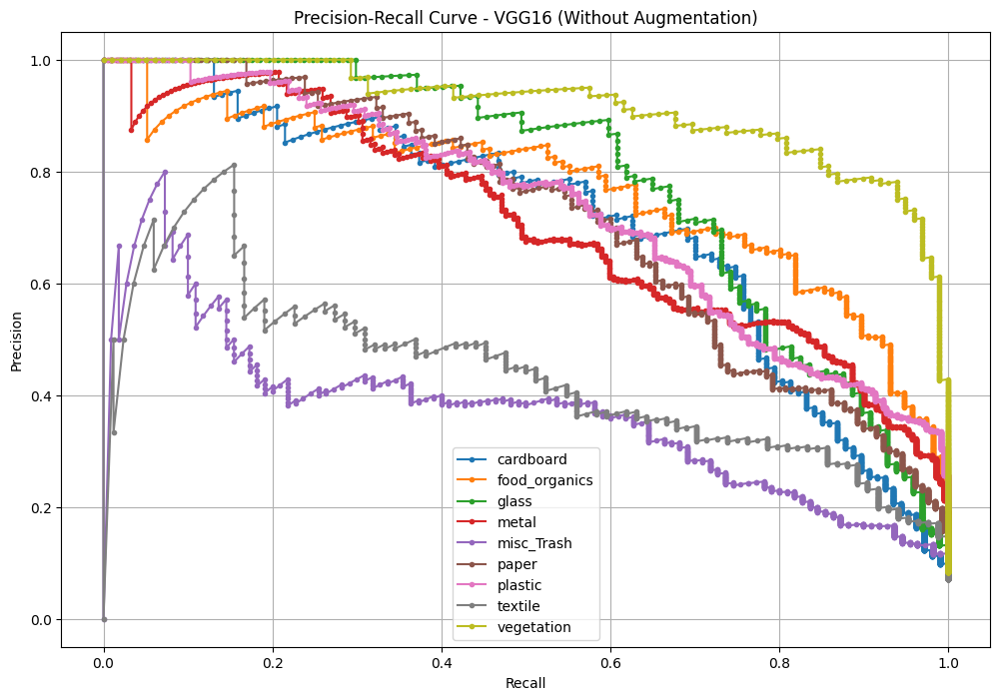

In [22]:
# Evaluate the model
test_loss, test_acc = model.evaluate(X_test_scaled, y_test, verbose=2)
print(f'\nTest accuracy: {test_acc}')

import matplotlib.pyplot as plt
from sklearn.metrics import classification_report, precision_recall_curve
import numpy as np

# Predict classes for the test set
y_pred = model.predict(X_test_scaled)
y_pred_classes = np.argmax(y_pred, axis=1) 

# Generate classification report
class_names = list(waste_image_labels.keys())  
report = classification_report(y_test, y_pred_classes, target_names=class_names)
print(report)

# Generate precision-recall curve for each class
plt.figure(figsize=(12, 8))
for i, class_name in enumerate(class_names):
    precision, recall, _ = precision_recall_curve(y_test == i, y_pred[:, i])
    plt.plot(recall, precision, marker='.', label=class_name)

plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve - VGG16 (Without Augmentation)')
plt.legend(loc='best')
plt.grid(True)
plt.show()

### ResNet50 without Data Augmenting

In [25]:
# code sourced from https://stackoverflow.com/questions/67701192/transfer-learning-with-resnet50-for-image-classification
from tensorflow.keras.applications import ResNet50

# Define the model using ResNet50 with some trainable layers
input_shape = (80, 80, 3)  
base_model = ResNet50(weights='imagenet', include_top=False, input_shape=input_shape)

# Unfreeze the top layers of ResNet50 for fine-tuning
for layer in base_model.layers[-4:]:
    layer.trainable = True

model = Sequential([
    base_model,
    layers.GlobalAveragePooling2D(),  # Global average pooling instead of Flatten
    layers.Dense(256, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(0.01)),
    layers.Dropout(0.5),
    layers.Dense(len(waste_image_labels), activation='softmax')
])

# Compile the model
model.compile(optimizer='adam',
              loss='sparse_categorical_crossentropy',  
              metrics=['accuracy'])

# Train the model with callbacks
model.fit(X_train_scaled, y_train, epochs=100, validation_data=(X_test_scaled, y_test),
          callbacks=[early_stopping, reduce_lr])


Epoch 1/100
112/112 [==============================] - 27s 78ms/step - loss: 4.5950 - accuracy: 0.5048 - val_loss: 30.0614 - val_accuracy: 0.1094 - lr: 0.0010
Epoch 2/100
112/112 [==============================] - 8s 71ms/step - loss: 2.2160 - accuracy: 0.6310 - val_loss: 6.8303 - val_accuracy: 0.0901 - lr: 0.0010
Epoch 3/100
112/112 [==============================] - 8s 70ms/step - loss: 1.4150 - accuracy: 0.7054 - val_loss: 7.2462 - val_accuracy: 0.0901 - lr: 0.0010
Epoch 4/100
112/112 [==============================] - 8s 71ms/step - loss: 0.9753 - accuracy: 0.7736 - val_loss: 4.9434 - val_accuracy: 0.0901 - lr: 0.0010
Epoch 5/100
112/112 [==============================] - 8s 70ms/step - loss: 0.8104 - accuracy: 0.7921 - val_loss: 9.7704 - val_accuracy: 0.0901 - lr: 0.0010
Epoch 6/100
112/112 [==============================] - 8s 71ms/step - loss: 0.6225 - accuracy: 0.8457 - val_loss: 9.6202 - val_accuracy: 0.0816 - lr: 0.0010
Epoch 7/100
112/112 [==============================] - 8

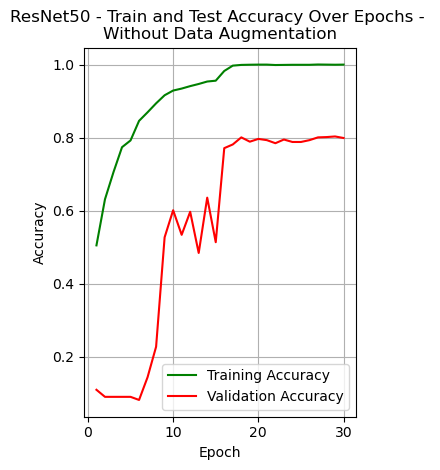

In [21]:

data = {
    'Epoch': list(range(1, 31)),
    
    'Training Accuracy': [
        0.5048, 0.6310, 0.7054, 0.7736, 0.7921, 0.8457, 0.8692, 0.8937, 0.9158, 0.9287,
        0.9341, 0.9408, 0.9467, 0.9534, 0.9557, 0.9823, 0.9969, 0.9989, 0.9994, 0.9997,
        0.9997, 0.9986, 0.9989, 0.9992, 0.9992, 0.9992, 1.0000, 0.9997, 0.9994, 0.9997
    ],
   
    'Validation Accuracy': [
        0.1094, 0.0901, 0.0901, 0.0901, 0.0901, 0.0816, 0.1439, 0.2273, 0.5269, 0.6010,
        0.5337, 0.5968, 0.4840, 0.6355, 0.5135, 0.7710, 0.7811, 0.8005, 0.7887, 0.7963,
        0.7929, 0.7845, 0.7946, 0.7879, 0.7879, 0.7929, 0.8005, 0.8013, 0.8030, 0.7988
    ]
}

# Create DataFrame
df = pd.DataFrame(data)

# Plot Accuracy
plt.subplot(1, 2, 2)
plt.plot(df['Epoch'], df['Training Accuracy'], label='Training Accuracy', color='green')
plt.plot(df['Epoch'], df['Validation Accuracy'], label='Validation Accuracy', color='red')
plt.title('ResNet50 - Train and Test Accuracy Over Epochs - \nWithout Data Augmentation')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()


38/38 - 1s - loss: 0.7887 - accuracy: 0.7963 - 776ms/epoch - 20ms/step

Test accuracy: 0.7962962985038757
38/38 [==============================] - 1s 16ms/step
               precision    recall  f1-score   support

    cardboard       0.75      0.82      0.79       107
food_organics       0.90      0.79      0.84       116
        glass       0.93      0.80      0.86        97
        metal       0.82      0.81      0.81       212
   misc_Trash       0.65      0.57      0.61       110
        paper       0.85      0.82      0.83       130
      plastic       0.76      0.85      0.80       233
      textile       0.67      0.65      0.66        84
   vegetation       0.85      0.96      0.90        99

     accuracy                           0.80      1188
    macro avg       0.80      0.79      0.79      1188
 weighted avg       0.80      0.80      0.80      1188



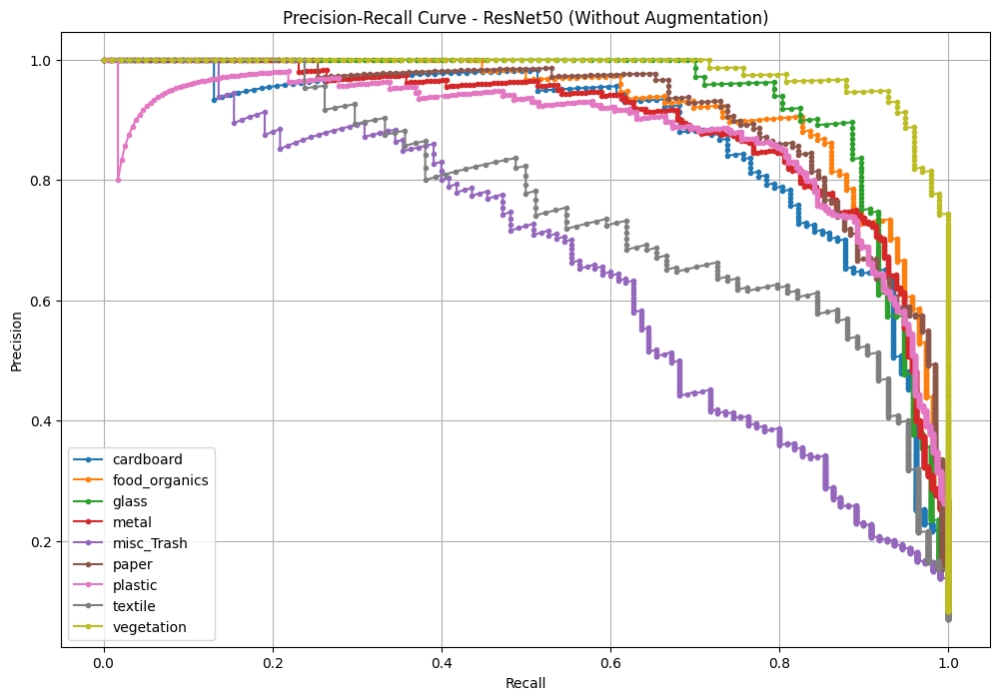

In [26]:
# Evaluate the model
test_loss, test_acc = model.evaluate(X_test_scaled, y_test, verbose=2)
print(f'\nTest accuracy: {test_acc}')


import matplotlib.pyplot as plt
from sklearn.metrics import classification_report, precision_recall_curve
import numpy as np

# Predict classes for the test set
y_pred = model.predict(X_test_scaled)
y_pred_classes = np.argmax(y_pred, axis=1)  # Convert probabilities to class labels

# Generate classification report
class_names = list(waste_image_labels.keys())  # Get class names from the dictionary
report = classification_report(y_test, y_pred_classes, target_names=class_names)
print(report)

# Generate precision-recall curve for each class
plt.figure(figsize=(12, 8))
for i, class_name in enumerate(class_names):
    precision, recall, _ = precision_recall_curve(y_test == i, y_pred[:, i])
    plt.plot(recall, precision, marker='.', label=class_name)

plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve - ResNet50 (Without Augmentation)')
plt.legend(loc='best')
plt.grid(True)
plt.show()


### MobileNetV2 without Data Augmenting

In [48]:
# sourced from https://www.tensorflow.org/api_docs/python/tf/keras/applications/MobileNetV2
from tensorflow.keras.applications import MobileNetV2

# Define the model using MobileNetV2 with some trainable layers
input_shape = (80, 80, 3)  
base_model = MobileNetV2(weights='imagenet', include_top=False, input_shape=input_shape)

# Unfreeze the top layers of MobileNetV2 for fine-tuning
for layer in base_model.layers[-10:]:
    layer.trainable = True

model = Sequential([
    base_model,
    layers.GlobalAveragePooling2D(),
    layers.Dense(256, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(0.001)),
    layers.Dropout(0.5),
    layers.Dense(len(waste_image_labels), activation='softmax')
])

# Compile the model
model.compile(optimizer='adam',
              loss='sparse_categorical_crossentropy',  
              metrics=['accuracy'])

# Train the model with callbacks
model.fit(X_train_scaled, y_train, epochs=100, validation_data=(X_test_scaled, y_test),
          callbacks=[early_stopping, reduce_lr])

Epoch 1/100
112/112 [==============================] - 19s 45ms/step - loss: 1.9251 - accuracy: 0.5045 - val_loss: 5.2218 - val_accuracy: 0.2475 - lr: 0.0010
Epoch 2/100
112/112 [==============================] - 3s 30ms/step - loss: 1.3754 - accuracy: 0.6622 - val_loss: 5.4229 - val_accuracy: 0.2753 - lr: 0.0010
Epoch 3/100
112/112 [==============================] - 3s 31ms/step - loss: 1.1183 - accuracy: 0.7306 - val_loss: 4.4885 - val_accuracy: 0.3064 - lr: 0.0010
Epoch 4/100
112/112 [==============================] - 3s 30ms/step - loss: 1.0052 - accuracy: 0.7657 - val_loss: 4.3853 - val_accuracy: 0.3123 - lr: 0.0010
Epoch 5/100
112/112 [==============================] - 3s 30ms/step - loss: 0.7865 - accuracy: 0.8187 - val_loss: 6.7343 - val_accuracy: 0.3350 - lr: 0.0010
Epoch 6/100
112/112 [==============================] - 3s 30ms/step - loss: 0.7351 - accuracy: 0.8356 - val_loss: 3.9742 - val_accuracy: 0.3594 - lr: 0.0010
Epoch 7/100
112/112 [==============================] - 3s

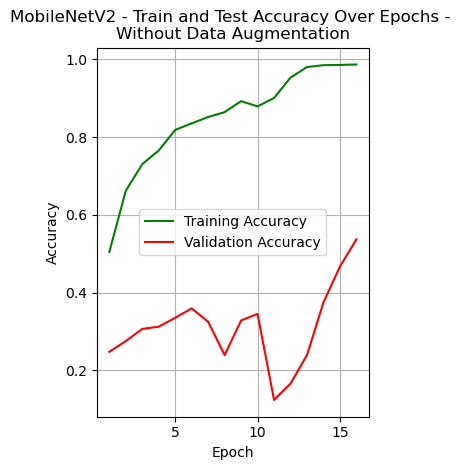

In [22]:
import pandas as pd
import matplotlib.pyplot as plt

data = {
    'Epoch': list(range(1, 17)),
    
    'Training Accuracy': [
        0.5045, 0.6622, 0.7306, 0.7657, 0.8187, 0.8356, 0.8519, 0.8645, 0.8928, 0.8793,
        0.9010, 0.9534, 0.9806, 0.9854, 0.9860, 0.9871
    ],
    
    'Validation Accuracy': [
        0.2475, 0.2753, 0.3064, 0.3123, 0.3350, 0.3594, 0.3249, 0.2391, 0.3283, 0.3451,
        0.1237, 0.1658, 0.2391, 0.3746, 0.4672, 0.5370
    ]
}

# Create DataFrame
df = pd.DataFrame(data)

# Plot Accuracy
plt.subplot(1, 2, 2)
plt.plot(df['Epoch'], df['Training Accuracy'], label='Training Accuracy', color='green')
plt.plot(df['Epoch'], df['Validation Accuracy'], label='Validation Accuracy', color='red')
plt.title('MobileNetV2 - Train and Test Accuracy Over Epochs - \nWithout Data Augmentation')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()


38/38 - 0s - loss: 3.9742 - accuracy: 0.3594 - 398ms/epoch - 10ms/step

Test accuracy: 0.3594276010990143
38/38 [==============================] - 1s 6ms/step
               precision    recall  f1-score   support

    cardboard       0.22      0.76      0.34       107
food_organics       0.63      0.32      0.42       116
        glass       0.00      0.00      0.00        97
        metal       0.39      0.77      0.52       212
   misc_Trash       0.21      0.35      0.27       110
        paper       0.55      0.14      0.22       130
      plastic       0.64      0.04      0.07       233
      textile       0.00      0.00      0.00        84
   vegetation       0.68      0.80      0.73        99

     accuracy                           0.36      1188
    macro avg       0.37      0.35      0.29      1188
 weighted avg       0.41      0.36      0.29      1188



/home/oriaguaman/anaconda3/envs/tf_gpu/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/oriaguaman/anaconda3/envs/tf_gpu/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/oriaguaman/anaconda3/envs/tf_gpu/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.

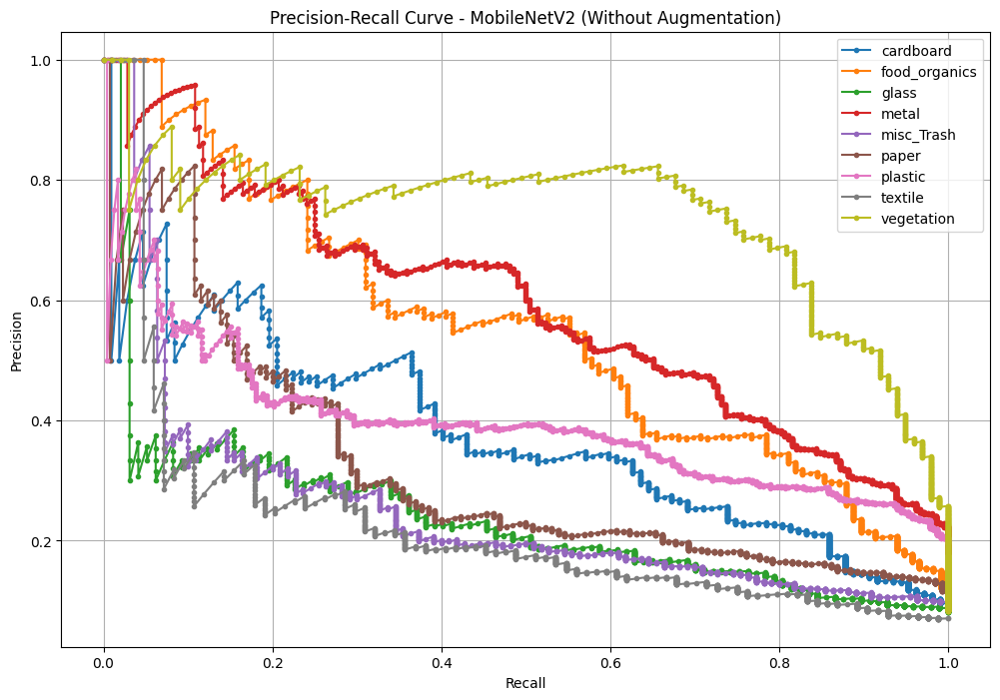

In [49]:
# Evaluate the model
test_loss, test_acc = model.evaluate(X_test_scaled, y_test, verbose=2)
print(f'\nTest accuracy: {test_acc}')

import matplotlib.pyplot as plt
from sklearn.metrics import classification_report, precision_recall_curve
import numpy as np

# Predict classes for the test set
y_pred = model.predict(X_test_scaled)
y_pred_classes = np.argmax(y_pred, axis=1)  # Convert probabilities to class labels

# Generate classification report
class_names = list(waste_image_labels.keys())  # Get class names from the dictionary
report = classification_report(y_test, y_pred_classes, target_names=class_names)
print(report)

# Generate precision-recall curve for each class
plt.figure(figsize=(12, 8))
for i, class_name in enumerate(class_names):
    precision, recall, _ = precision_recall_curve(y_test == i, y_pred[:, i])
    plt.plot(recall, precision, marker='.', label=class_name)

plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve - MobileNetV2 (Without Augmentation)')
plt.legend(loc='best')
plt.grid(True)
plt.show()


### InceptionV3 without Data Augmenting

In [32]:
# code sourced from https://medium.com/@armielynobinguar/simple-implementation-of-inceptionv3-for-image-classification-using-tensorflow-and-keras-6557feb9bf53
from tensorflow.keras.applications import InceptionV3

# Define the model using InceptionV3 with some trainable layers
input_shape = (80, 80, 3)  
base_model = InceptionV3(weights='imagenet', include_top=False, input_shape=input_shape)

# Unfreeze the top layers of InceptionV3 for fine-tuning
for layer in base_model.layers[-10:]:  
    layer.trainable = True

model = Sequential([
    base_model,
    layers.GlobalAveragePooling2D(),  
    layers.Dense(256, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(0.001)),
    layers.Dropout(0.5),
    layers.Dense(len(waste_image_labels), activation='softmax')
])

# Compile the model
model.compile(optimizer='adam',
              loss='sparse_categorical_crossentropy',  
              metrics=['accuracy'])

# Train the model with callbacks
model.fit(X_train_scaled, y_train, epochs=100, validation_data=(X_test_scaled, y_test),
          callbacks=[early_stopping, reduce_lr])


Epoch 1/100


2024-07-27 11:59:55.734023: W tensorflow/compiler/xla/stream_executor/gpu/asm_compiler.cc:115] *** WARNING *** You are using ptxas 10.1.243, which is older than 11.1. ptxas before 11.1 is known to miscompile XLA code, leading to incorrect results or invalid-address errors.

You may not need to update to CUDA 11.1; cherry-picking the ptxas binary is often sufficient.
2024-07-27 11:59:55.864569: W tensorflow/compiler/xla/stream_executor/gpu/asm_compiler.cc:115] *** WARNING *** You are using ptxas 10.1.243, which is older than 11.1. ptxas before 11.1 is known to miscompile XLA code, leading to incorrect results or invalid-address errors.

You may not need to update to CUDA 11.1; cherry-picking the ptxas binary is often sufficient.
2024-07-27 11:59:56.256552: W tensorflow/compiler/xla/stream_executor/gpu/asm_compiler.cc:115] *** WARNING *** You are using ptxas 10.1.243, which is older than 11.1. ptxas before 11.1 is known to miscompile XLA code, leading to incorrect results or invalid-addr

112/112 [==============================] - 30s 74ms/step - loss: 2.5319 - accuracy: 0.2424 - val_loss: 1300.8765 - val_accuracy: 0.1953 - lr: 0.0010
Epoch 2/100
112/112 [==============================] - 5s 47ms/step - loss: 2.0890 - accuracy: 0.3159 - val_loss: 666.4822 - val_accuracy: 0.2584 - lr: 0.0010
Epoch 3/100
112/112 [==============================] - 5s 47ms/step - loss: 1.9841 - accuracy: 0.3443 - val_loss: 2.5394 - val_accuracy: 0.1776 - lr: 0.0010
Epoch 4/100
112/112 [==============================] - 5s 47ms/step - loss: 1.9572 - accuracy: 0.3241 - val_loss: 1.9249 - val_accuracy: 0.3072 - lr: 0.0010
Epoch 5/100
112/112 [==============================] - 5s 46ms/step - loss: 1.8336 - accuracy: 0.3768 - val_loss: 217.7885 - val_accuracy: 0.1145 - lr: 0.0010
Epoch 6/100
112/112 [==============================] - 5s 46ms/step - loss: 1.7850 - accuracy: 0.3808 - val_loss: 5.2862 - val_accuracy: 0.2551 - lr: 0.0010
Epoch 7/100
112/112 [==============================] - 5s 46ms

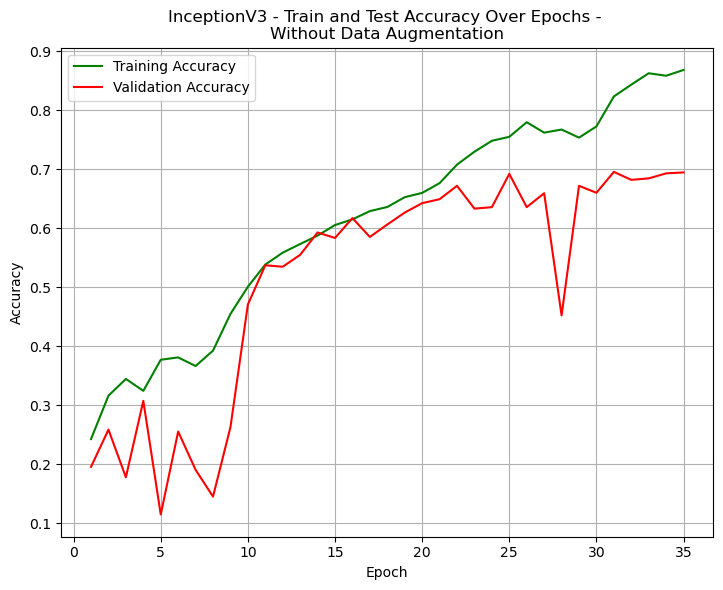

In [23]:
import pandas as pd
import matplotlib.pyplot as plt

# Data from the training log
data = {
    'Epoch': list(range(1, 36)),
    'Training Accuracy': [
        0.2424, 0.3159, 0.3443, 0.3241, 0.3768, 0.3808, 0.3662, 0.3923, 0.4545,
        0.5006, 0.5382, 0.5584, 0.5730, 0.5873, 0.6052, 0.6148, 0.6288, 0.6358,
        0.6524, 0.6597, 0.6762, 0.7076, 0.7295, 0.7480, 0.7548, 0.7795, 0.7618,
        0.7671, 0.7534, 0.7724, 0.8232, 0.8432, 0.8625, 0.8583, 0.8681
    ],
    'Validation Accuracy': [
        0.1953, 0.2584, 0.1776, 0.3072, 0.1145, 0.2551, 0.1902, 0.1448, 0.2626,
        0.4705, 0.5370, 0.5345, 0.5547, 0.5926, 0.5833, 0.6170, 0.5850, 0.6061,
        0.6263, 0.6423, 0.6490, 0.6717, 0.6330, 0.6355, 0.6919, 0.6355, 0.6591,
        0.4520, 0.6717, 0.6599, 0.6953, 0.6818, 0.6843, 0.6928, 0.6944
    ]
}

# Create DataFrame
df = pd.DataFrame(data)

# Plot Loss and Accuracy
plt.figure(figsize=(14, 6))

# Plot Accuracy
plt.subplot(1, 2, 2)
plt.plot(df['Epoch'], df['Training Accuracy'], label='Training Accuracy', color='green')
plt.plot(df['Epoch'], df['Validation Accuracy'], label='Validation Accuracy', color='red')
plt.title('InceptionV3 - Train and Test Accuracy Over Epochs - \nWithout Data Augmentation')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()

38/38 - 1s - loss: 0.9064 - accuracy: 0.6919 - 533ms/epoch - 14ms/step

Test accuracy: 0.691919207572937
38/38 [==============================] - 1s 11ms/step
               precision    recall  f1-score   support

    cardboard       0.66      0.72      0.69       107
food_organics       0.83      0.76      0.79       116
        glass       0.76      0.77      0.77        97
        metal       0.76      0.66      0.71       212
   misc_Trash       0.50      0.52      0.51       110
        paper       0.64      0.62      0.63       130
      plastic       0.63      0.72      0.67       233
      textile       0.63      0.55      0.59        84
   vegetation       0.88      0.92      0.90        99

     accuracy                           0.69      1188
    macro avg       0.70      0.69      0.69      1188
 weighted avg       0.70      0.69      0.69      1188



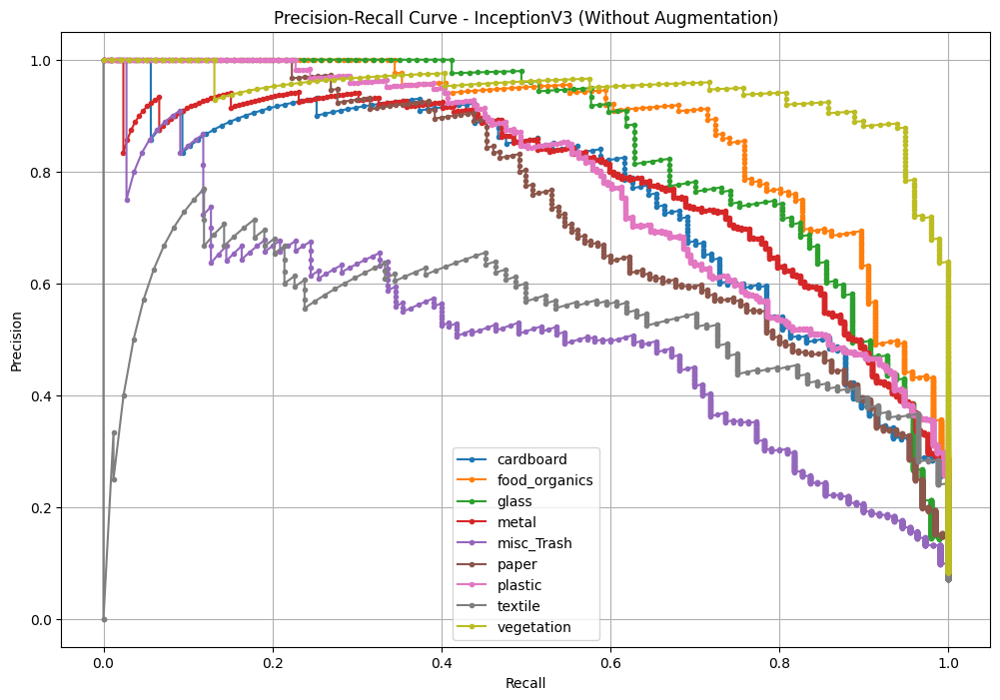

In [33]:
# Evaluate the model
test_loss, test_acc = model.evaluate(X_test_scaled, y_test, verbose=2)
print(f'\nTest accuracy: {test_acc}')

import matplotlib.pyplot as plt
from sklearn.metrics import classification_report, precision_recall_curve
import numpy as np

# Predict classes for the test set
y_pred = model.predict(X_test_scaled)
y_pred_classes = np.argmax(y_pred, axis=1)  # Convert probabilities to class labels

# Generate classification report
class_names = list(waste_image_labels.keys())  # Get class names from the dictionary
report = classification_report(y_test, y_pred_classes, target_names=class_names)
print(report)

# Generate precision-recall curve for each class
plt.figure(figsize=(12, 8))
for i, class_name in enumerate(class_names):
    precision, recall, _ = precision_recall_curve(y_test == i, y_pred[:, i])
    plt.plot(recall, precision, marker='.', label=class_name)

plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve - InceptionV3 (Without Augmentation)')
plt.legend(loc='best')
plt.grid(True)
plt.show()


## Generating Images With GAN

In [45]:
from tensorflow.keras.optimizers import Adam
import tensorflow as tf
from tensorflow.keras import layers, Model, Sequential
from tensorflow.keras.optimizers import Adam
import numpy as np
import matplotlib.pyplot as plt
import cv2
import pathlib
import os

In [46]:
# code sourced from https://www.youtube.com/watch?v=AALBGpLbj6Q&t=603s
# Configuration
image_size = (80, 80, 3)  
latent_dim = 100          
batch_size = 16
epochs = 500    

# Lightweight Generator
def build_lightweight_generator():
    model = Sequential(name="Lightweight_Generator")
    model.add(layers.Dense(10 * 10 * 128, use_bias=False, input_shape=(latent_dim,)))  # Adjust for new image size
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU())
    model.add(layers.Reshape((10, 10, 128)))  # Adjust for new image size

    model.add(layers.Conv2DTranspose(64, (5, 5), strides=(2, 2), padding='same', use_bias=False))
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU())

    model.add(layers.Conv2DTranspose(32, (5, 5), strides=(2, 2), padding='same', use_bias=False))
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU())

    model.add(layers.Conv2DTranspose(3, (5, 5), strides=(2, 2), padding='same', use_bias=False, activation='tanh'))
    return model

In [47]:
# code sourced from https://www.youtube.com/watch?v=AALBGpLbj6Q&t=603s
# Lightweight Discriminator
def build_lightweight_discriminator():
    input_img = layers.Input(shape=image_size)

    x = layers.Conv2D(32, (5, 5), strides=(2, 2), padding='same')(input_img)
    x = layers.LeakyReLU()(x)
    x = layers.Dropout(0.3)(x)

    x = layers.Conv2D(64, (5, 5), strides=(2, 2), padding='same')(x)
    x = layers.LeakyReLU()(x)
    x = layers.Dropout(0.3)(x)

    x = layers.Conv2D(128, (5, 5), strides=(2, 2), padding='same')(x)
    x = layers.LeakyReLU()(x)
    x = layers.Dropout(0.3)(x)

    validity = layers.Flatten()(x)
    validity = layers.Dense(1)(validity)

    return Model(input_img, validity, name="Lightweight_Discriminator")

In [48]:
# code sourced from https://www.youtube.com/watch?v=AALBGpLbj6Q&t=603s
# Loss Functions
def generator_loss(fake_output):
    return -tf.reduce_mean(fake_output)

def discriminator_loss(real_output, fake_output):
    return tf.reduce_mean(fake_output) - tf.reduce_mean(real_output)

# Optimizers
generator_optimizer = Adam(1e-3)
discriminator_optimizer = Adam(1e-3)

# Build and compile models
generator = build_lightweight_generator()
discriminator = build_lightweight_discriminator()

In [49]:
# code sourced from https://www.youtube.com/watch?v=AALBGpLbj6Q&t=603s
# Training Loop
@tf.function
def train_step(images):
    noise = tf.random.normal([batch_size, latent_dim])

    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
        generated_images = generator(noise, training=True)

        real_output = discriminator(images, training=True)
        fake_output = discriminator(generated_images, training=True)

        gen_loss = generator_loss(fake_output)
        disc_loss = discriminator_loss(real_output, fake_output)

    gradients_of_generator = gen_tape.gradient(gen_loss, generator.trainable_variables)
    gradients_of_discriminator = disc_tape.gradient(disc_loss, discriminator.trainable_variables)

    generator_optimizer.apply_gradients(zip(gradients_of_generator, generator.trainable_variables))
    discriminator_optimizer.apply_gradients(zip(gradients_of_discriminator, discriminator.trainable_variables))


In [50]:
data_dirs = pathlib.Path('./dataset/original')
waste_images_dictss = {
    'cardboard': list(data_dir.glob('Cardboard/*')),
    'food_organics': list(data_dir.glob('FoodOrganics/*')),
    'glass': list(data_dir.glob('Glass/*')),
    'metal': list(data_dir.glob('Metal/*')),
    'misc_Trash': list(data_dir.glob('MiscellaneousTrash/*')),
    'paper': list(data_dir.glob('Paper/*')),
    'plastic': list(data_dir.glob('Plastic/*')),
    'textile': list(data_dir.glob('TextileTrash/*')),
    'vegetation': list(data_dir.glob('Vegetation/*')),
}

waste_image_labelss = {
    'cardboard': 0,
    'food_organics': 1,
    'glass': 2,
    'metal': 3,
    'misc_Trash': 4,
    'paper': 5,
    'plastic': 6,
    'textile': 7,
    'vegetation': 8,
}

In [51]:
X, y = [], []
for waste_name, images in waste_images_dictss.items():
    for image in images:
        img = cv2.imread(str(image))
        resized_img = cv2.resize(img, (80, 80)) 
        X.append(resized_img)
        y.append(waste_image_labelss[waste_name])

X = np.array(X)
y = np.array(y)

# Normalize images to [-1, 1]
X = (X - 127.5) / 127.5

In [52]:
# code sourced from https://www.youtube.com/watch?v=AALBGpLbj6Q&t=603s
# Create a directory to save generated images if it doesn't exist
output_dir = 'generated_images'
if not os.path.exists(output_dir):
    os.makedirs(output_dir)

# Training Loop
def generate_and_save_images(model, epoch, test_input):
    predictions = model(test_input, training=False)

    fig = plt.figure(figsize=(4, 4))

    for i in range(predictions.shape[0]):
        plt.subplot(4, 4, i+1)
        plt.imshow((predictions[i].numpy() * 127.5 + 127.5).astype(np.uint8))  # Convert to numpy before astype
        plt.axis('off')

    image_path = os.path.join(output_dir, f'image_at_epoch_{epoch:04d}.png')
    plt.savefig(image_path)
    plt.show()

Starting epoch 1/500


2024-07-27 15:58:45.894402: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inLightweight_Discriminator/dropout_5/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer
2024-07-27 15:58:46.894334: W tensorflow/compiler/xla/stream_executor/gpu/asm_compiler.cc:115] *** WARNING *** You are using ptxas 10.1.243, which is older than 11.1. ptxas before 11.1 is known to miscompile XLA code, leading to incorrect results or invalid-address errors.

You may not need to update to CUDA 11.1; cherry-picking the ptxas binary is often sufficient.
2024-07-27 15:58:47.259755: W tensorflow/compiler/xla/stream_executor/gpu/asm_compiler.cc:115] *** WARNING *** You are using ptxas 10.1.243, which is older than 11.1. ptxas before 11.1 is known to miscompile XLA code, leading to incorrect results or invalid-address errors.

You may not need to update to CUDA 11.1; cherry-picking the ptxas binary 

Epoch 1 completed
Starting epoch 2/500
Epoch 2 completed
Starting epoch 3/500
Epoch 3 completed
Starting epoch 4/500
Epoch 4 completed
Starting epoch 5/500
Epoch 5 completed
Starting epoch 6/500
Epoch 6 completed
Starting epoch 7/500
Epoch 7 completed
Starting epoch 8/500
Epoch 8 completed
Starting epoch 9/500
Epoch 9 completed
Starting epoch 10/500


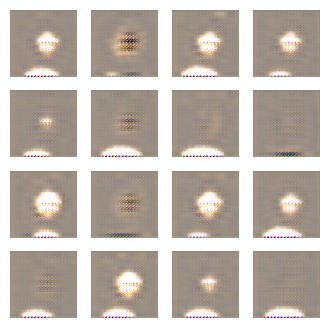

Epoch 10 completed
Starting epoch 11/500
Epoch 11 completed
Starting epoch 12/500
Epoch 12 completed
Starting epoch 13/500
Epoch 13 completed
Starting epoch 14/500
Epoch 14 completed
Starting epoch 15/500
Epoch 15 completed
Starting epoch 16/500
Epoch 16 completed
Starting epoch 17/500
Epoch 17 completed
Starting epoch 18/500
Epoch 18 completed
Starting epoch 19/500
Epoch 19 completed
Starting epoch 20/500


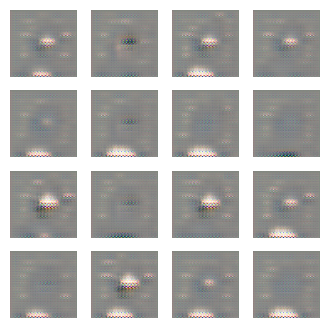

Epoch 20 completed
Starting epoch 21/500
Epoch 21 completed
Starting epoch 22/500
Epoch 22 completed
Starting epoch 23/500
Epoch 23 completed
Starting epoch 24/500
Epoch 24 completed
Starting epoch 25/500
Epoch 25 completed
Starting epoch 26/500
Epoch 26 completed
Starting epoch 27/500
Epoch 27 completed
Starting epoch 28/500
Epoch 28 completed
Starting epoch 29/500
Epoch 29 completed
Starting epoch 30/500


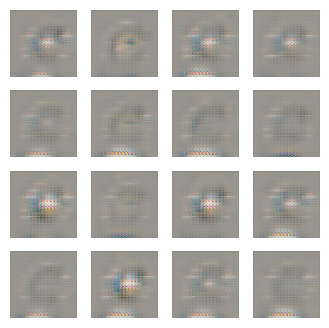

Epoch 30 completed
Starting epoch 31/500
Epoch 31 completed
Starting epoch 32/500
Epoch 32 completed
Starting epoch 33/500
Epoch 33 completed
Starting epoch 34/500
Epoch 34 completed
Starting epoch 35/500
Epoch 35 completed
Starting epoch 36/500
Epoch 36 completed
Starting epoch 37/500
Epoch 37 completed
Starting epoch 38/500
Epoch 38 completed
Starting epoch 39/500
Epoch 39 completed
Starting epoch 40/500


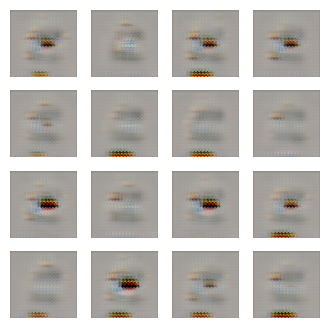

Epoch 40 completed
Starting epoch 41/500
Epoch 41 completed
Starting epoch 42/500
Epoch 42 completed
Starting epoch 43/500
Epoch 43 completed
Starting epoch 44/500
Epoch 44 completed
Starting epoch 45/500
Epoch 45 completed
Starting epoch 46/500
Epoch 46 completed
Starting epoch 47/500
Epoch 47 completed
Starting epoch 48/500
Epoch 48 completed
Starting epoch 49/500
Epoch 49 completed
Starting epoch 50/500


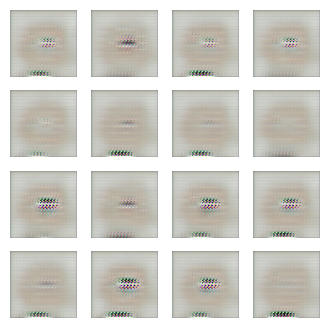

Epoch 50 completed
Starting epoch 51/500
Epoch 51 completed
Starting epoch 52/500
Epoch 52 completed
Starting epoch 53/500
Epoch 53 completed
Starting epoch 54/500
Epoch 54 completed
Starting epoch 55/500
Epoch 55 completed
Starting epoch 56/500
Epoch 56 completed
Starting epoch 57/500
Epoch 57 completed
Starting epoch 58/500
Epoch 58 completed
Starting epoch 59/500
Epoch 59 completed
Starting epoch 60/500


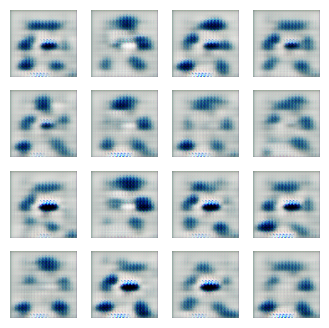

Epoch 60 completed
Starting epoch 61/500
Epoch 61 completed
Starting epoch 62/500
Epoch 62 completed
Starting epoch 63/500
Epoch 63 completed
Starting epoch 64/500
Epoch 64 completed
Starting epoch 65/500
Epoch 65 completed
Starting epoch 66/500
Epoch 66 completed
Starting epoch 67/500
Epoch 67 completed
Starting epoch 68/500
Epoch 68 completed
Starting epoch 69/500
Epoch 69 completed
Starting epoch 70/500


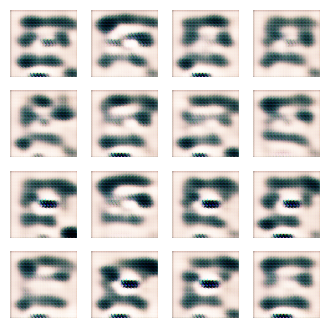

Epoch 70 completed
Starting epoch 71/500
Epoch 71 completed
Starting epoch 72/500
Epoch 72 completed
Starting epoch 73/500
Epoch 73 completed
Starting epoch 74/500
Epoch 74 completed
Starting epoch 75/500
Epoch 75 completed
Starting epoch 76/500
Epoch 76 completed
Starting epoch 77/500
Epoch 77 completed
Starting epoch 78/500
Epoch 78 completed
Starting epoch 79/500
Epoch 79 completed
Starting epoch 80/500


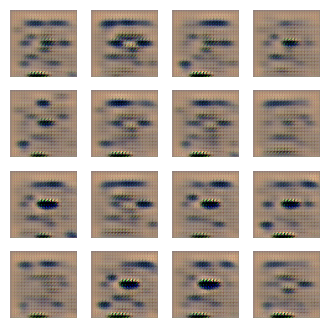

Epoch 80 completed
Starting epoch 81/500
Epoch 81 completed
Starting epoch 82/500
Epoch 82 completed
Starting epoch 83/500
Epoch 83 completed
Starting epoch 84/500
Epoch 84 completed
Starting epoch 85/500
Epoch 85 completed
Starting epoch 86/500
Epoch 86 completed
Starting epoch 87/500
Epoch 87 completed
Starting epoch 88/500
Epoch 88 completed
Starting epoch 89/500
Epoch 89 completed
Starting epoch 90/500


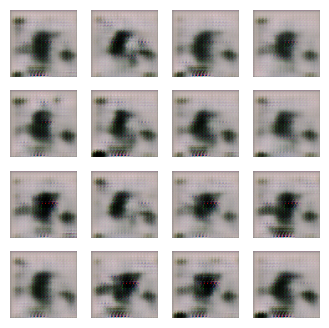

Epoch 90 completed
Starting epoch 91/500
Epoch 91 completed
Starting epoch 92/500
Epoch 92 completed
Starting epoch 93/500
Epoch 93 completed
Starting epoch 94/500
Epoch 94 completed
Starting epoch 95/500
Epoch 95 completed
Starting epoch 96/500
Epoch 96 completed
Starting epoch 97/500
Epoch 97 completed
Starting epoch 98/500
Epoch 98 completed
Starting epoch 99/500
Epoch 99 completed
Starting epoch 100/500


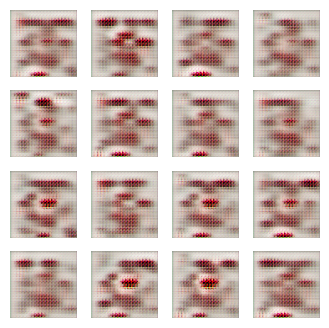

Epoch 100 completed
Starting epoch 101/500
Epoch 101 completed
Starting epoch 102/500
Epoch 102 completed
Starting epoch 103/500
Epoch 103 completed
Starting epoch 104/500
Epoch 104 completed
Starting epoch 105/500
Epoch 105 completed
Starting epoch 106/500
Epoch 106 completed
Starting epoch 107/500
Epoch 107 completed
Starting epoch 108/500
Epoch 108 completed
Starting epoch 109/500
Epoch 109 completed
Starting epoch 110/500


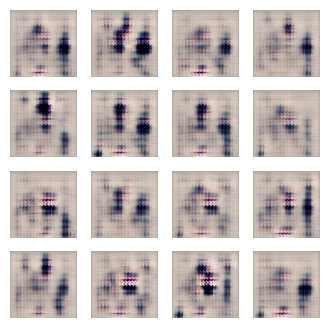

Epoch 110 completed
Starting epoch 111/500
Epoch 111 completed
Starting epoch 112/500
Epoch 112 completed
Starting epoch 113/500
Epoch 113 completed
Starting epoch 114/500
Epoch 114 completed
Starting epoch 115/500
Epoch 115 completed
Starting epoch 116/500
Epoch 116 completed
Starting epoch 117/500
Epoch 117 completed
Starting epoch 118/500
Epoch 118 completed
Starting epoch 119/500
Epoch 119 completed
Starting epoch 120/500


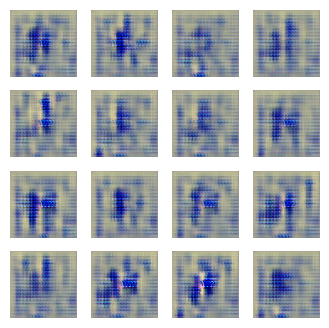

Epoch 120 completed
Starting epoch 121/500
Epoch 121 completed
Starting epoch 122/500
Epoch 122 completed
Starting epoch 123/500
Epoch 123 completed
Starting epoch 124/500
Epoch 124 completed
Starting epoch 125/500
Epoch 125 completed
Starting epoch 126/500
Epoch 126 completed
Starting epoch 127/500
Epoch 127 completed
Starting epoch 128/500
Epoch 128 completed
Starting epoch 129/500
Epoch 129 completed
Starting epoch 130/500


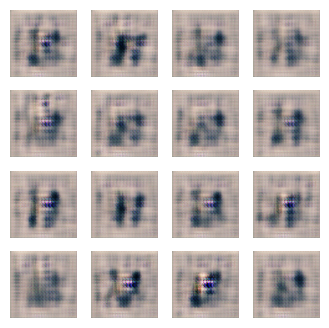

Epoch 130 completed
Starting epoch 131/500
Epoch 131 completed
Starting epoch 132/500
Epoch 132 completed
Starting epoch 133/500
Epoch 133 completed
Starting epoch 134/500
Epoch 134 completed
Starting epoch 135/500
Epoch 135 completed
Starting epoch 136/500
Epoch 136 completed
Starting epoch 137/500
Epoch 137 completed
Starting epoch 138/500
Epoch 138 completed
Starting epoch 139/500
Epoch 139 completed
Starting epoch 140/500


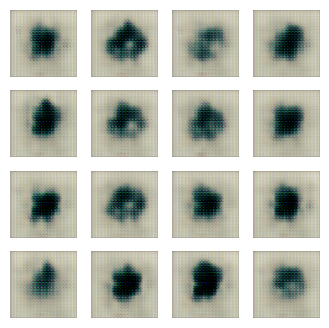

Epoch 140 completed
Starting epoch 141/500
Epoch 141 completed
Starting epoch 142/500
Epoch 142 completed
Starting epoch 143/500
Epoch 143 completed
Starting epoch 144/500
Epoch 144 completed
Starting epoch 145/500
Epoch 145 completed
Starting epoch 146/500
Epoch 146 completed
Starting epoch 147/500
Epoch 147 completed
Starting epoch 148/500
Epoch 148 completed
Starting epoch 149/500
Epoch 149 completed
Starting epoch 150/500


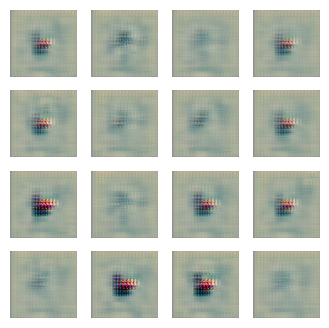

Epoch 150 completed
Starting epoch 151/500
Epoch 151 completed
Starting epoch 152/500
Epoch 152 completed
Starting epoch 153/500
Epoch 153 completed
Starting epoch 154/500
Epoch 154 completed
Starting epoch 155/500
Epoch 155 completed
Starting epoch 156/500
Epoch 156 completed
Starting epoch 157/500
Epoch 157 completed
Starting epoch 158/500
Epoch 158 completed
Starting epoch 159/500
Epoch 159 completed
Starting epoch 160/500


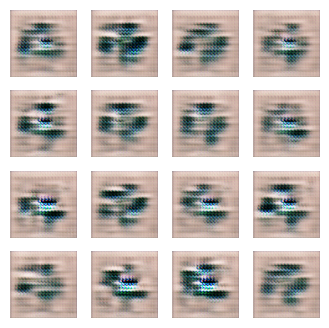

Epoch 160 completed
Starting epoch 161/500
Epoch 161 completed
Starting epoch 162/500
Epoch 162 completed
Starting epoch 163/500
Epoch 163 completed
Starting epoch 164/500
Epoch 164 completed
Starting epoch 165/500
Epoch 165 completed
Starting epoch 166/500
Epoch 166 completed
Starting epoch 167/500
Epoch 167 completed
Starting epoch 168/500
Epoch 168 completed
Starting epoch 169/500
Epoch 169 completed
Starting epoch 170/500


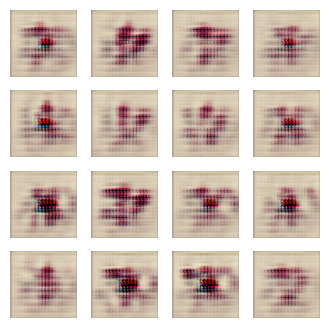

Epoch 170 completed
Starting epoch 171/500
Epoch 171 completed
Starting epoch 172/500
Epoch 172 completed
Starting epoch 173/500
Epoch 173 completed
Starting epoch 174/500
Epoch 174 completed
Starting epoch 175/500
Epoch 175 completed
Starting epoch 176/500
Epoch 176 completed
Starting epoch 177/500
Epoch 177 completed
Starting epoch 178/500
Epoch 178 completed
Starting epoch 179/500
Epoch 179 completed
Starting epoch 180/500


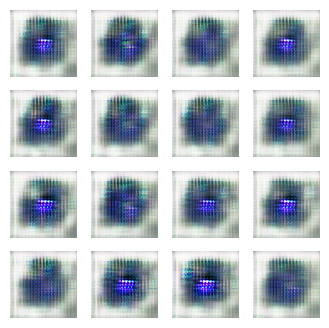

Epoch 180 completed
Starting epoch 181/500
Epoch 181 completed
Starting epoch 182/500
Epoch 182 completed
Starting epoch 183/500
Epoch 183 completed
Starting epoch 184/500
Epoch 184 completed
Starting epoch 185/500
Epoch 185 completed
Starting epoch 186/500
Epoch 186 completed
Starting epoch 187/500
Epoch 187 completed
Starting epoch 188/500
Epoch 188 completed
Starting epoch 189/500
Epoch 189 completed
Starting epoch 190/500


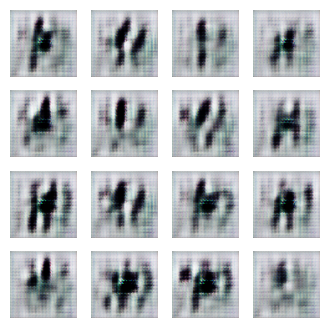

Epoch 190 completed
Starting epoch 191/500
Epoch 191 completed
Starting epoch 192/500
Epoch 192 completed
Starting epoch 193/500
Epoch 193 completed
Starting epoch 194/500
Epoch 194 completed
Starting epoch 195/500
Epoch 195 completed
Starting epoch 196/500
Epoch 196 completed
Starting epoch 197/500
Epoch 197 completed
Starting epoch 198/500
Epoch 198 completed
Starting epoch 199/500
Epoch 199 completed
Starting epoch 200/500


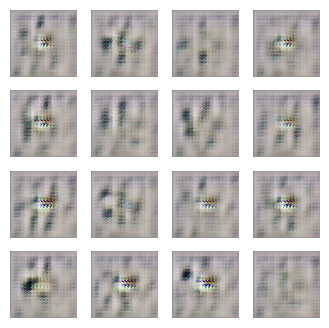

Epoch 200 completed
Starting epoch 201/500
Epoch 201 completed
Starting epoch 202/500
Epoch 202 completed
Starting epoch 203/500
Epoch 203 completed
Starting epoch 204/500
Epoch 204 completed
Starting epoch 205/500
Epoch 205 completed
Starting epoch 206/500
Epoch 206 completed
Starting epoch 207/500
Epoch 207 completed
Starting epoch 208/500
Epoch 208 completed
Starting epoch 209/500
Epoch 209 completed
Starting epoch 210/500


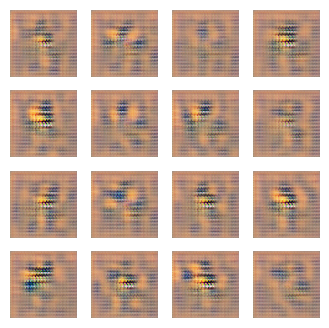

Epoch 210 completed
Starting epoch 211/500
Epoch 211 completed
Starting epoch 212/500
Epoch 212 completed
Starting epoch 213/500
Epoch 213 completed
Starting epoch 214/500
Epoch 214 completed
Starting epoch 215/500
Epoch 215 completed
Starting epoch 216/500
Epoch 216 completed
Starting epoch 217/500
Epoch 217 completed
Starting epoch 218/500
Epoch 218 completed
Starting epoch 219/500
Epoch 219 completed
Starting epoch 220/500


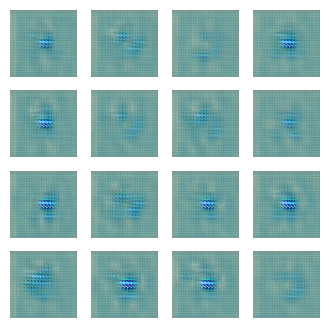

Epoch 220 completed
Starting epoch 221/500
Epoch 221 completed
Starting epoch 222/500
Epoch 222 completed
Starting epoch 223/500
Epoch 223 completed
Starting epoch 224/500
Epoch 224 completed
Starting epoch 225/500
Epoch 225 completed
Starting epoch 226/500
Epoch 226 completed
Starting epoch 227/500
Epoch 227 completed
Starting epoch 228/500
Epoch 228 completed
Starting epoch 229/500
Epoch 229 completed
Starting epoch 230/500


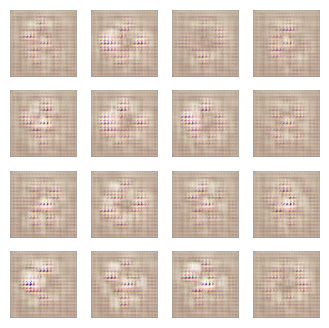

Epoch 230 completed
Starting epoch 231/500
Epoch 231 completed
Starting epoch 232/500
Epoch 232 completed
Starting epoch 233/500
Epoch 233 completed
Starting epoch 234/500
Epoch 234 completed
Starting epoch 235/500
Epoch 235 completed
Starting epoch 236/500
Epoch 236 completed
Starting epoch 237/500
Epoch 237 completed
Starting epoch 238/500
Epoch 238 completed
Starting epoch 239/500
Epoch 239 completed
Starting epoch 240/500


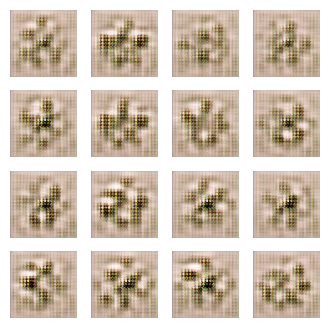

Epoch 240 completed
Starting epoch 241/500
Epoch 241 completed
Starting epoch 242/500
Epoch 242 completed
Starting epoch 243/500
Epoch 243 completed
Starting epoch 244/500
Epoch 244 completed
Starting epoch 245/500
Epoch 245 completed
Starting epoch 246/500
Epoch 246 completed
Starting epoch 247/500
Epoch 247 completed
Starting epoch 248/500
Epoch 248 completed
Starting epoch 249/500
Epoch 249 completed
Starting epoch 250/500


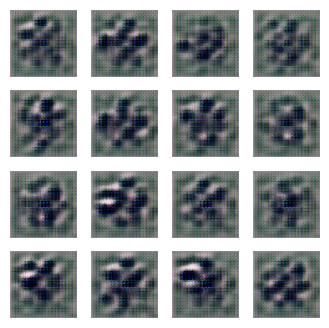

Epoch 250 completed
Starting epoch 251/500
Epoch 251 completed
Starting epoch 252/500
Epoch 252 completed
Starting epoch 253/500
Epoch 253 completed
Starting epoch 254/500
Epoch 254 completed
Starting epoch 255/500
Epoch 255 completed
Starting epoch 256/500
Epoch 256 completed
Starting epoch 257/500
Epoch 257 completed
Starting epoch 258/500
Epoch 258 completed
Starting epoch 259/500
Epoch 259 completed
Starting epoch 260/500


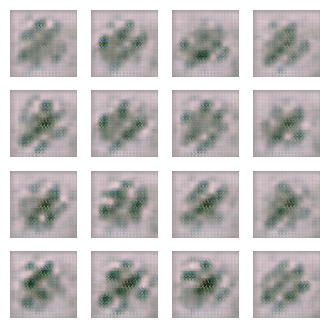

Epoch 260 completed
Starting epoch 261/500
Epoch 261 completed
Starting epoch 262/500
Epoch 262 completed
Starting epoch 263/500
Epoch 263 completed
Starting epoch 264/500
Epoch 264 completed
Starting epoch 265/500
Epoch 265 completed
Starting epoch 266/500
Epoch 266 completed
Starting epoch 267/500
Epoch 267 completed
Starting epoch 268/500
Epoch 268 completed
Starting epoch 269/500
Epoch 269 completed
Starting epoch 270/500


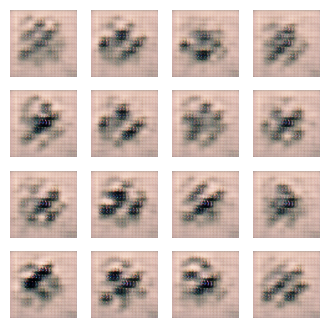

Epoch 270 completed
Starting epoch 271/500
Epoch 271 completed
Starting epoch 272/500
Epoch 272 completed
Starting epoch 273/500
Epoch 273 completed
Starting epoch 274/500
Epoch 274 completed
Starting epoch 275/500
Epoch 275 completed
Starting epoch 276/500
Epoch 276 completed
Starting epoch 277/500
Epoch 277 completed
Starting epoch 278/500
Epoch 278 completed
Starting epoch 279/500
Epoch 279 completed
Starting epoch 280/500


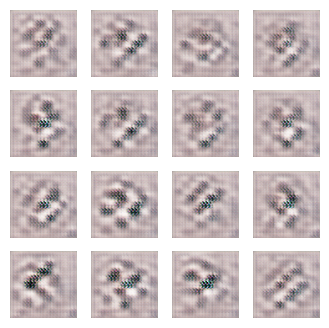

Epoch 280 completed
Starting epoch 281/500
Epoch 281 completed
Starting epoch 282/500
Epoch 282 completed
Starting epoch 283/500
Epoch 283 completed
Starting epoch 284/500
Epoch 284 completed
Starting epoch 285/500
Epoch 285 completed
Starting epoch 286/500
Epoch 286 completed
Starting epoch 287/500
Epoch 287 completed
Starting epoch 288/500
Epoch 288 completed
Starting epoch 289/500
Epoch 289 completed
Starting epoch 290/500


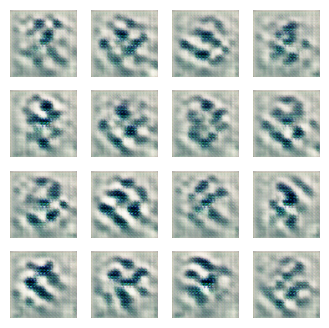

Epoch 290 completed
Starting epoch 291/500
Epoch 291 completed
Starting epoch 292/500
Epoch 292 completed
Starting epoch 293/500
Epoch 293 completed
Starting epoch 294/500
Epoch 294 completed
Starting epoch 295/500
Epoch 295 completed
Starting epoch 296/500
Epoch 296 completed
Starting epoch 297/500
Epoch 297 completed
Starting epoch 298/500
Epoch 298 completed
Starting epoch 299/500
Epoch 299 completed
Starting epoch 300/500


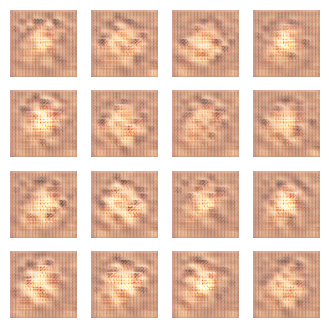

Epoch 300 completed
Starting epoch 301/500
Epoch 301 completed
Starting epoch 302/500
Epoch 302 completed
Starting epoch 303/500
Epoch 303 completed
Starting epoch 304/500
Epoch 304 completed
Starting epoch 305/500
Epoch 305 completed
Starting epoch 306/500
Epoch 306 completed
Starting epoch 307/500
Epoch 307 completed
Starting epoch 308/500
Epoch 308 completed
Starting epoch 309/500
Epoch 309 completed
Starting epoch 310/500


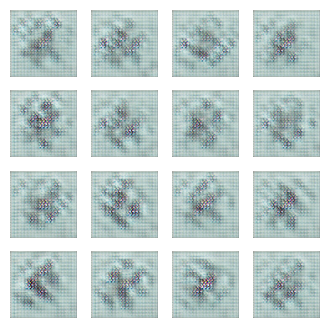

Epoch 310 completed
Starting epoch 311/500
Epoch 311 completed
Starting epoch 312/500
Epoch 312 completed
Starting epoch 313/500
Epoch 313 completed
Starting epoch 314/500
Epoch 314 completed
Starting epoch 315/500
Epoch 315 completed
Starting epoch 316/500
Epoch 316 completed
Starting epoch 317/500
Epoch 317 completed
Starting epoch 318/500
Epoch 318 completed
Starting epoch 319/500
Epoch 319 completed
Starting epoch 320/500


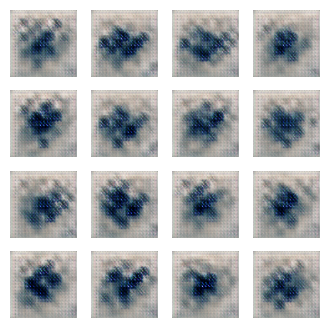

Epoch 320 completed
Starting epoch 321/500
Epoch 321 completed
Starting epoch 322/500
Epoch 322 completed
Starting epoch 323/500
Epoch 323 completed
Starting epoch 324/500
Epoch 324 completed
Starting epoch 325/500
Epoch 325 completed
Starting epoch 326/500
Epoch 326 completed
Starting epoch 327/500
Epoch 327 completed
Starting epoch 328/500
Epoch 328 completed
Starting epoch 329/500
Epoch 329 completed
Starting epoch 330/500


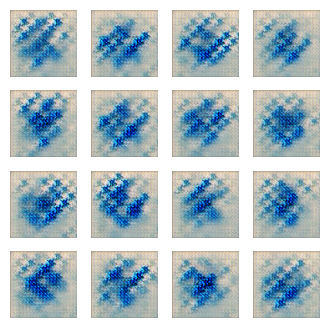

Epoch 330 completed
Starting epoch 331/500
Epoch 331 completed
Starting epoch 332/500
Epoch 332 completed
Starting epoch 333/500
Epoch 333 completed
Starting epoch 334/500
Epoch 334 completed
Starting epoch 335/500
Epoch 335 completed
Starting epoch 336/500
Epoch 336 completed
Starting epoch 337/500
Epoch 337 completed
Starting epoch 338/500
Epoch 338 completed
Starting epoch 339/500
Epoch 339 completed
Starting epoch 340/500


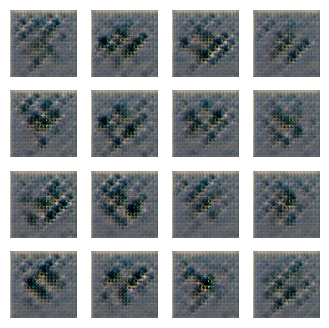

Epoch 340 completed
Starting epoch 341/500
Epoch 341 completed
Starting epoch 342/500
Epoch 342 completed
Starting epoch 343/500
Epoch 343 completed
Starting epoch 344/500
Epoch 344 completed
Starting epoch 345/500
Epoch 345 completed
Starting epoch 346/500
Epoch 346 completed
Starting epoch 347/500
Epoch 347 completed
Starting epoch 348/500
Epoch 348 completed
Starting epoch 349/500
Epoch 349 completed
Starting epoch 350/500


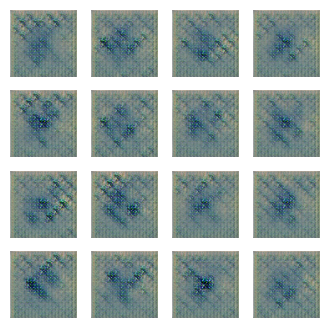

Epoch 350 completed
Starting epoch 351/500
Epoch 351 completed
Starting epoch 352/500
Epoch 352 completed
Starting epoch 353/500
Epoch 353 completed
Starting epoch 354/500
Epoch 354 completed
Starting epoch 355/500
Epoch 355 completed
Starting epoch 356/500
Epoch 356 completed
Starting epoch 357/500
Epoch 357 completed
Starting epoch 358/500
Epoch 358 completed
Starting epoch 359/500
Epoch 359 completed
Starting epoch 360/500


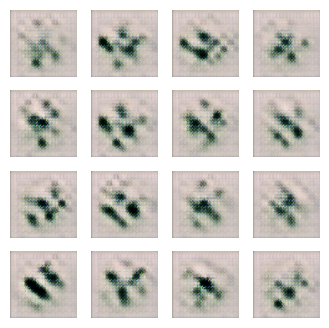

Epoch 360 completed
Starting epoch 361/500
Epoch 361 completed
Starting epoch 362/500
Epoch 362 completed
Starting epoch 363/500
Epoch 363 completed
Starting epoch 364/500
Epoch 364 completed
Starting epoch 365/500
Epoch 365 completed
Starting epoch 366/500
Epoch 366 completed
Starting epoch 367/500
Epoch 367 completed
Starting epoch 368/500
Epoch 368 completed
Starting epoch 369/500
Epoch 369 completed
Starting epoch 370/500


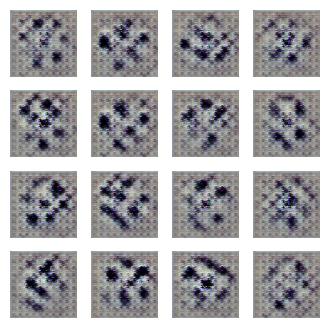

Epoch 370 completed
Starting epoch 371/500
Epoch 371 completed
Starting epoch 372/500
Epoch 372 completed
Starting epoch 373/500
Epoch 373 completed
Starting epoch 374/500
Epoch 374 completed
Starting epoch 375/500
Epoch 375 completed
Starting epoch 376/500
Epoch 376 completed
Starting epoch 377/500
Epoch 377 completed
Starting epoch 378/500
Epoch 378 completed
Starting epoch 379/500
Epoch 379 completed
Starting epoch 380/500


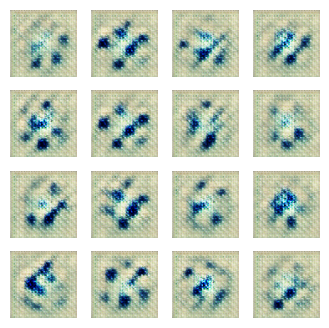

Epoch 380 completed
Starting epoch 381/500
Epoch 381 completed
Starting epoch 382/500
Epoch 382 completed
Starting epoch 383/500
Epoch 383 completed
Starting epoch 384/500
Epoch 384 completed
Starting epoch 385/500
Epoch 385 completed
Starting epoch 386/500
Epoch 386 completed
Starting epoch 387/500
Epoch 387 completed
Starting epoch 388/500
Epoch 388 completed
Starting epoch 389/500
Epoch 389 completed
Starting epoch 390/500


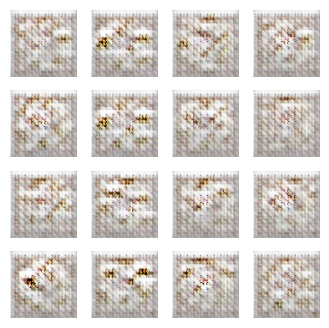

Epoch 390 completed
Starting epoch 391/500
Epoch 391 completed
Starting epoch 392/500
Epoch 392 completed
Starting epoch 393/500
Epoch 393 completed
Starting epoch 394/500
Epoch 394 completed
Starting epoch 395/500
Epoch 395 completed
Starting epoch 396/500
Epoch 396 completed
Starting epoch 397/500
Epoch 397 completed
Starting epoch 398/500
Epoch 398 completed
Starting epoch 399/500
Epoch 399 completed
Starting epoch 400/500


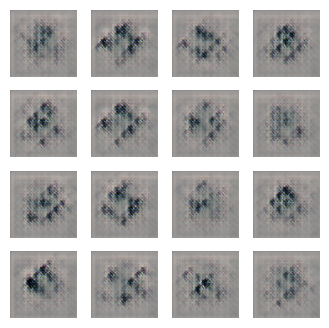

Epoch 400 completed
Starting epoch 401/500
Epoch 401 completed
Starting epoch 402/500
Epoch 402 completed
Starting epoch 403/500
Epoch 403 completed
Starting epoch 404/500
Epoch 404 completed
Starting epoch 405/500
Epoch 405 completed
Starting epoch 406/500
Epoch 406 completed
Starting epoch 407/500
Epoch 407 completed
Starting epoch 408/500
Epoch 408 completed
Starting epoch 409/500
Epoch 409 completed
Starting epoch 410/500


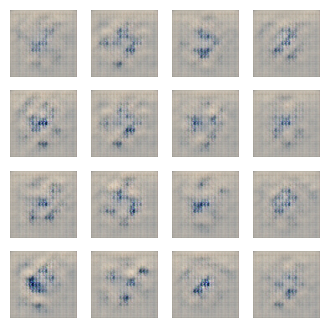

Epoch 410 completed
Starting epoch 411/500
Epoch 411 completed
Starting epoch 412/500
Epoch 412 completed
Starting epoch 413/500
Epoch 413 completed
Starting epoch 414/500
Epoch 414 completed
Starting epoch 415/500
Epoch 415 completed
Starting epoch 416/500
Epoch 416 completed
Starting epoch 417/500
Epoch 417 completed
Starting epoch 418/500
Epoch 418 completed
Starting epoch 419/500
Epoch 419 completed
Starting epoch 420/500


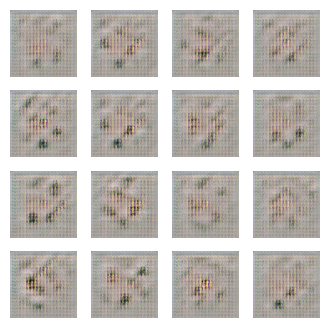

Epoch 420 completed
Starting epoch 421/500
Epoch 421 completed
Starting epoch 422/500
Epoch 422 completed
Starting epoch 423/500
Epoch 423 completed
Starting epoch 424/500
Epoch 424 completed
Starting epoch 425/500
Epoch 425 completed
Starting epoch 426/500
Epoch 426 completed
Starting epoch 427/500
Epoch 427 completed
Starting epoch 428/500
Epoch 428 completed
Starting epoch 429/500
Epoch 429 completed
Starting epoch 430/500


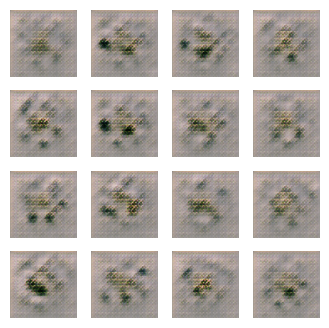

Epoch 430 completed
Starting epoch 431/500
Epoch 431 completed
Starting epoch 432/500
Epoch 432 completed
Starting epoch 433/500
Epoch 433 completed
Starting epoch 434/500
Epoch 434 completed
Starting epoch 435/500
Epoch 435 completed
Starting epoch 436/500
Epoch 436 completed
Starting epoch 437/500
Epoch 437 completed
Starting epoch 438/500
Epoch 438 completed
Starting epoch 439/500
Epoch 439 completed
Starting epoch 440/500


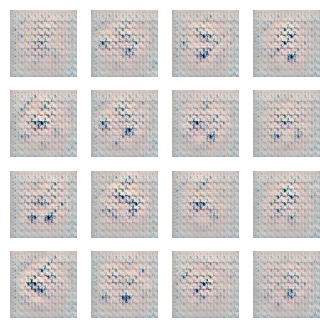

Epoch 440 completed
Starting epoch 441/500
Epoch 441 completed
Starting epoch 442/500
Epoch 442 completed
Starting epoch 443/500
Epoch 443 completed
Starting epoch 444/500
Epoch 444 completed
Starting epoch 445/500
Epoch 445 completed
Starting epoch 446/500
Epoch 446 completed
Starting epoch 447/500
Epoch 447 completed
Starting epoch 448/500
Epoch 448 completed
Starting epoch 449/500
Epoch 449 completed
Starting epoch 450/500


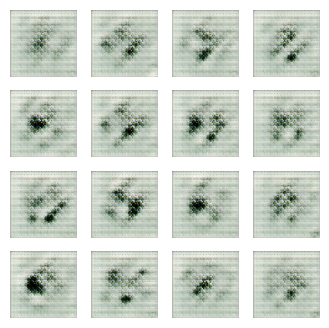

Epoch 450 completed
Starting epoch 451/500
Epoch 451 completed
Starting epoch 452/500
Epoch 452 completed
Starting epoch 453/500
Epoch 453 completed
Starting epoch 454/500
Epoch 454 completed
Starting epoch 455/500
Epoch 455 completed
Starting epoch 456/500
Epoch 456 completed
Starting epoch 457/500
Epoch 457 completed
Starting epoch 458/500
Epoch 458 completed
Starting epoch 459/500
Epoch 459 completed
Starting epoch 460/500


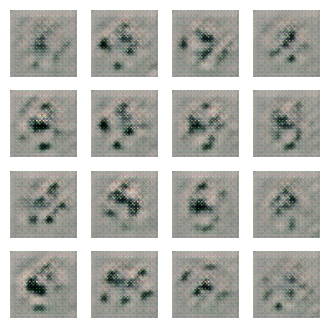

Epoch 460 completed
Starting epoch 461/500
Epoch 461 completed
Starting epoch 462/500
Epoch 462 completed
Starting epoch 463/500
Epoch 463 completed
Starting epoch 464/500
Epoch 464 completed
Starting epoch 465/500
Epoch 465 completed
Starting epoch 466/500
Epoch 466 completed
Starting epoch 467/500
Epoch 467 completed
Starting epoch 468/500
Epoch 468 completed
Starting epoch 469/500
Epoch 469 completed
Starting epoch 470/500


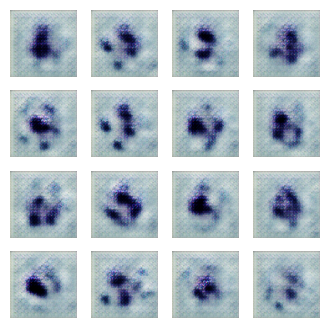

Epoch 470 completed
Starting epoch 471/500
Epoch 471 completed
Starting epoch 472/500
Epoch 472 completed
Starting epoch 473/500
Epoch 473 completed
Starting epoch 474/500
Epoch 474 completed
Starting epoch 475/500
Epoch 475 completed
Starting epoch 476/500
Epoch 476 completed
Starting epoch 477/500
Epoch 477 completed
Starting epoch 478/500
Epoch 478 completed
Starting epoch 479/500
Epoch 479 completed
Starting epoch 480/500


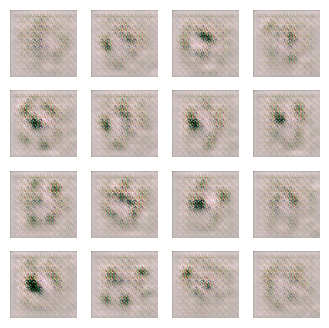

Epoch 480 completed
Starting epoch 481/500
Epoch 481 completed
Starting epoch 482/500
Epoch 482 completed
Starting epoch 483/500
Epoch 483 completed
Starting epoch 484/500
Epoch 484 completed
Starting epoch 485/500
Epoch 485 completed
Starting epoch 486/500
Epoch 486 completed
Starting epoch 487/500
Epoch 487 completed
Starting epoch 488/500
Epoch 488 completed
Starting epoch 489/500
Epoch 489 completed
Starting epoch 490/500


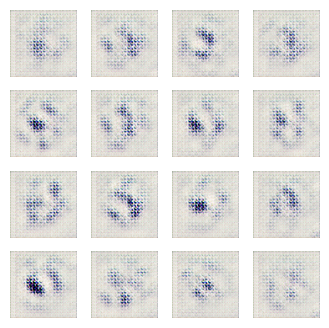

Epoch 490 completed
Starting epoch 491/500
Epoch 491 completed
Starting epoch 492/500
Epoch 492 completed
Starting epoch 493/500
Epoch 493 completed
Starting epoch 494/500
Epoch 494 completed
Starting epoch 495/500
Epoch 495 completed
Starting epoch 496/500
Epoch 496 completed
Starting epoch 497/500
Epoch 497 completed
Starting epoch 498/500
Epoch 498 completed
Starting epoch 499/500
Epoch 499 completed
Starting epoch 500/500


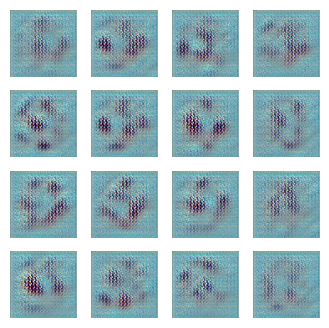

Epoch 500 completed
Training finished.


In [53]:
# code sourced from https://www.youtube.com/watch?v=AALBGpLbj6Q&t=603s
# Creating a fixed noise vector for visualization of the generator's progress
num_examples_to_generate = 16
seed = tf.random.normal([num_examples_to_generate, latent_dim])

# Training loop
for epoch in range(epochs):
    print(f'Starting epoch {epoch+1}/{epochs}')
    
    for batch_start in range(0, len(X), batch_size):
        image_batch = X[batch_start:batch_start + batch_size]
        
        # If the batch is smaller than the batch size, skip it
        if image_batch.shape[0] != batch_size:
            continue
        
        train_step(image_batch)

    # Generate and save images every 10 epochs
    if (epoch + 1) % 10 == 0:
        generate_and_save_images(generator, epoch + 1, seed)
        generator.save(f'generator_epoch_{epoch+1}.h5')
        discriminator.save(f'discriminator_epoch_{epoch+1}.h5')

    print(f'Epoch {epoch+1} completed')

print('Training finished.')

Starting epoch 1/500
Epoch 1 completed
Starting epoch 2/500
Epoch 2 completed
Starting epoch 3/500
Epoch 3 completed
Starting epoch 4/500
Epoch 4 completed
Starting epoch 5/500
Epoch 5 completed
Starting epoch 6/500
Epoch 6 completed
Starting epoch 7/500
Epoch 7 completed
Starting epoch 8/500
Epoch 8 completed
Starting epoch 9/500
Epoch 9 completed
Starting epoch 10/500
Epoch 10 completed
Starting epoch 11/500
Epoch 11 completed
Starting epoch 12/500
Epoch 12 completed
Starting epoch 13/500
Epoch 13 completed
Starting epoch 14/500
Epoch 14 completed
Starting epoch 15/500
Epoch 15 completed
Starting epoch 16/500
Epoch 16 completed
Starting epoch 17/500
Epoch 17 completed
Starting epoch 18/500
Epoch 18 completed
Starting epoch 19/500
Epoch 19 completed
Starting epoch 20/500
Epoch 20 completed
Starting epoch 21/500
Epoch 21 completed
Starting epoch 22/500
Epoch 22 completed
Starting epoch 23/500
Epoch 23 completed
Starting epoch 24/500
Epoch 24 completed
Starting epoch 25/500
Epoch 25 com

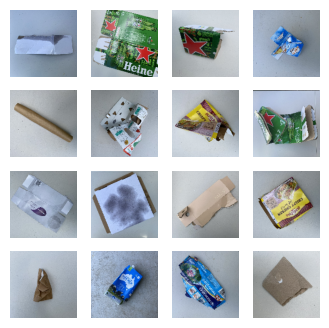

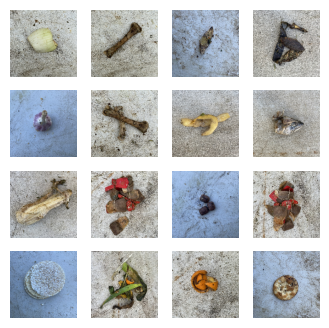

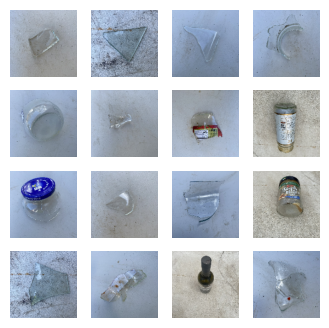

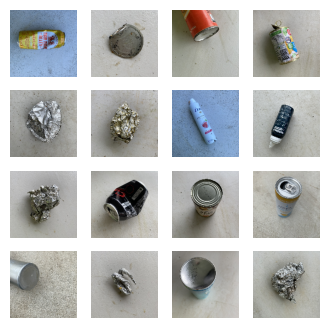

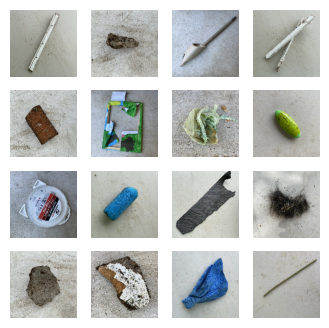

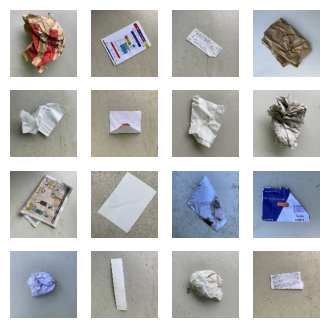

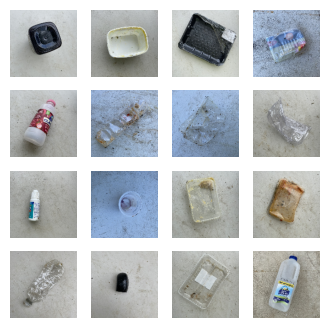

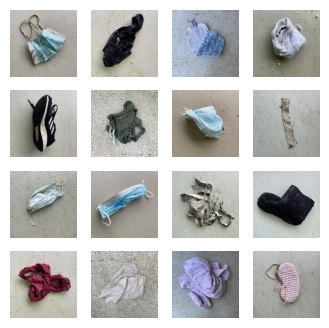

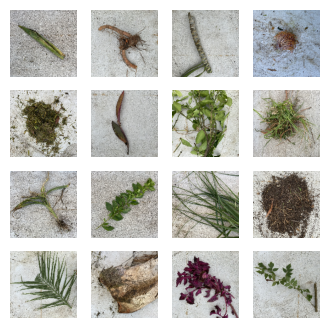

In [29]:
# code sourced from https://www.youtube.com/watch?v=AALBGpLbj6Q&t=603s
# Creating a fixed noise vector for visualization of the generator's progress
num_examples_to_generate = 16
seed = tf.random.normal([num_examples_to_generate, latent_dim])

# Training loop
for epoch in range(epochs):
    print(f'Starting epoch {epoch+1}/{epochs}')
    
    for batch_start in range(0, len(X), batch_size):
        image_batch = X[batch_start:batch_start + batch_size]
        
        # If the batch is smaller than the batch size, skip it
        if image_batch.shape[0] != batch_size:
            continue
        
        train_step(image_batch)

    # Generate and save images every 10 epochs
    if (epoch + 1) % 10 == 0:
        generate_and_save_images(generator, epoch + 1, seed)
        generator.save(f'generator_epoch_{epoch+1}.h5')
        discriminator.save(f'discriminator_epoch_{epoch+1}.h5')

    print(f'Epoch {epoch+1} completed')

print('Training finished.')

## Augumenting the Data Set (rotation, zoom, brightness, flip)

codes in this section was sourced from codebasics youtube tutorial which can be found on this link: https://youtube.com/playlist?list=PLeo1K3hjS3uu7CxAacxVndI4bE_o3BDtO&si=tsHbeo5xSW1G3OX6

In [20]:
# Create a directory to save augmented images
augmented_image_dir = './augmented_images_nnn'
os.makedirs(augmented_image_dir, exist_ok=True)

In [21]:
# Create class-specific directories within the augmented images directory
class_names = {v: k for k, v in waste_image_labels.items()}
for class_id, class_name in class_names.items():
    class_dir = os.path.join(augmented_image_dir, class_name)
    os.makedirs(class_dir, exist_ok=True)

In [22]:
#sourced from codebasics https://youtube.com/playlist?list=PLeo1K3hjS3uu7CxAacxVndI4bE_o3BDtO&si=tsHbeo5xSW1G3OX6
# Define the target size
target_size = (80, 80)

# Augmentation function
def augment_image(image):
    augmented_images = []
    h, w = image.shape[:2]
    
    # Random rotation
    angle = random.uniform(-20, 20)
    M = cv2.getRotationMatrix2D((w / 2, h / 2), angle, 1)
    aug_img = cv2.warpAffine(image, M, (w, h))
    aug_img = cv2.resize(aug_img, target_size)
    augmented_images.append(aug_img)

    # Random zoom
    zoom_factor = random.uniform(0.8, 1.2)
    aug_img = cv2.resize(image, None, fx=zoom_factor, fy=zoom_factor)
    h_zoom, w_zoom = aug_img.shape[:2]
    if h_zoom > target_size[1] and w_zoom > target_size[0]:
        start_x = (w_zoom - target_size[0]) // 2
        start_y = (h_zoom - target_size[1]) // 2
        aug_img = aug_img[start_y:start_y + target_size[1], start_x:start_x + target_size[0]]
    aug_img = cv2.resize(aug_img, target_size)
    augmented_images.append(aug_img)

    # Random brightness adjustment
    hsv = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)
    value = random.uniform(0.5, 1.5)
    hsv[:, :, 2] = hsv[:, :, 2] * value
    aug_img = cv2.cvtColor(hsv, cv2.COLOR_HSV2BGR)
    aug_img = cv2.resize(aug_img, target_size)
    augmented_images.append(aug_img)

    # Random flip
    flip_code = random.choice([-1, 0, 1])
    aug_img = cv2.flip(image, flip_code)
    aug_img = cv2.resize(aug_img, target_size)
    augmented_images.append(aug_img)

    return augmented_images



In [23]:
#sourced from codebasics https://youtube.com/playlist?list=PLeo1K3hjS3uu7CxAacxVndI4bE_o3BDtO&si=tsHbeo5xSW1G3OX6
# Count the number of images in each category
train_counts = {class_name: sum(y_train == class_id) for class_id, class_name in class_names.items()}
max_images_per_category = max(train_counts.values())

X_train_augmented = []
y_train_augmented = []

# Add the original data to augmented data
X_train_augmented.extend(X_train)
y_train_augmented.extend(y_train)

# Dictionary to keep count of images per category
augmented_count = {class_name: train_counts[class_name] for class_name in class_names.values()}

print("Augmenting data...")
for class_id, class_name in class_names.items():
    class_indices = [i for i, label in enumerate(y_train) if label == class_id]
    while augmented_count[class_name] < max_images_per_category:
        for i in class_indices:
            x = X_train[i]
            augmented_imgs = augment_image(x)
            for augmented_img in augmented_imgs:
                if augmented_count[class_name] >= max_images_per_category:
                    break
                X_train_augmented.append(augmented_img)
                y_train_augmented.append(class_id)
                augmented_count[class_name] += 1
                
                # Save the augmented image to the class-specific directory
                augmented_img_path = os.path.join(augmented_image_dir, class_name, 
                                                  f'augmented_{class_id}_{augmented_count[class_name]}.jpg')
                success = cv2.imwrite(augmented_img_path, augmented_img)
                if not success:
                    print(f"Failed to save image at {augmented_img_path}")


Augmenting data...


In [24]:
# Convert to numpy arrays
X_train_augmented = np.array(X_train_augmented)
y_train_augmented = np.array(y_train_augmented)


## Visualising to Check for Class Imbalance before Training

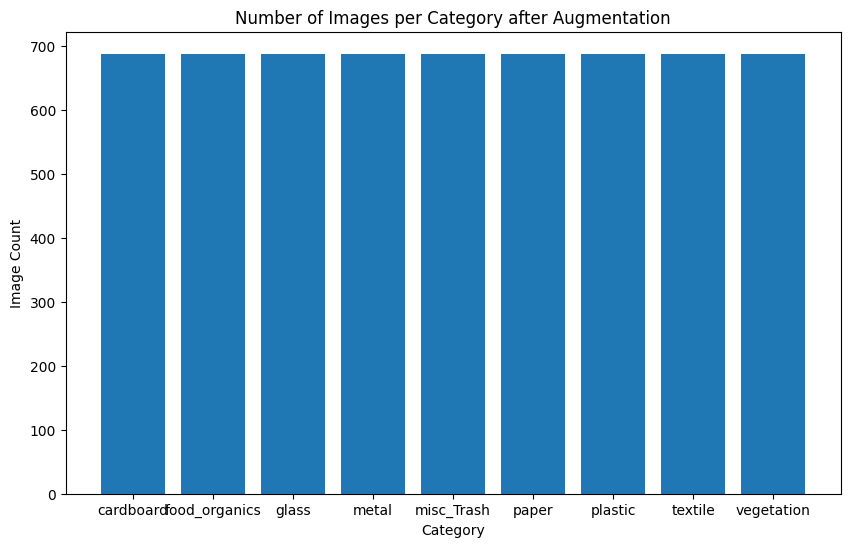

In [25]:
# Show the bar plot of the new image count per category
plt.figure(figsize=(10, 6))
plt.bar(augmented_count.keys(), augmented_count.values())
plt.xlabel('Category')
plt.ylabel('Image Count')
plt.title('Number of Images per Category after Augmentation')
plt.show()

In [26]:
X_train_augmented.shape

(6192, 80, 80, 3)

In [27]:
y_train_augmented.shape

(6192,)

In [28]:
X_train_scaled = X_train_augmented / 255
X_test_scaled = X_test / 255

## VGG16 Model After Augmentation

In [29]:
# code sourced from https://towardsdatascience.com/transfer-learning-with-vgg16-and-keras-50ea161580b4
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau

# Define the model using VGG16 with some trainable layers
input_shape = (80, 80, 3)
base_model = VGG16(weights='imagenet', include_top=False, input_shape=input_shape)

# Unfreeze the top layers of VGG16 for fine-tuning
for layer in base_model.layers[-10:]:
    layer.trainable = False

model = Sequential([
    base_model,
    layers.Flatten(),
    layers.Dense(256, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(0.1)),
    layers.Dropout(0.5),
    layers.Dense(len(waste_image_labels), activation='softmax')
])



2024-07-27 14:42:02.569711: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  SSE4.1 SSE4.2 AVX AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-07-27 14:42:02.579659: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:981] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2024-07-27 14:42:02.580516: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:981] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2024-07-27 14:42:02.581223: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:981] successful NUMA node read from SysFS had negative value (-1), but there m

In [30]:
# Compile the model
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.0001),
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=False),
              metrics=['accuracy'])

# Define callbacks
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=5, min_lr=0.00001)

In [31]:
# Train the model with callbacks
model.fit(X_train_scaled, y_train_augmented, epochs=100, validation_data=(X_test_scaled, y_test),
          callbacks=[early_stopping, reduce_lr])

2024-07-27 14:42:14.900758: W tensorflow/tsl/framework/cpu_allocator_impl.cc:82] Allocation of 475545600 exceeds 10% of free system memory.
2024-07-27 14:42:15.306326: W tensorflow/tsl/framework/cpu_allocator_impl.cc:82] Allocation of 475545600 exceeds 10% of free system memory.


Epoch 1/100


2024-07-27 14:42:18.849137: I tensorflow/compiler/xla/stream_executor/cuda/cuda_dnn.cc:428] Loaded cuDNN version 8907
2024-07-27 14:42:21.828191: W tensorflow/compiler/xla/stream_executor/gpu/asm_compiler.cc:115] *** WARNING *** You are using ptxas 10.1.243, which is older than 11.1. ptxas before 11.1 is known to miscompile XLA code, leading to incorrect results or invalid-address errors.

You may not need to update to CUDA 11.1; cherry-picking the ptxas binary is often sufficient.
2024-07-27 14:42:24.604960: I tensorflow/compiler/xla/service/service.cc:173] XLA service 0x5645f40042f0 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
2024-07-27 14:42:24.605028: I tensorflow/compiler/xla/service/service.cc:181]   StreamExecutor device (0): NVIDIA GeForce RTX 2060, Compute Capability 7.5
2024-07-27 14:42:25.095287: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:268] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DI

  3/194 [..............................] - ETA: 10s - loss: 47.8725 - accuracy: 0.1250  

2024-07-27 14:42:31.928402: W tensorflow/compiler/xla/stream_executor/gpu/asm_compiler.cc:115] *** WARNING *** You are using ptxas 10.1.243, which is older than 11.1. ptxas before 11.1 is known to miscompile XLA code, leading to incorrect results or invalid-address errors.

You may not need to update to CUDA 11.1; cherry-picking the ptxas binary is often sufficient.


194/194 [==============================] - 29s 69ms/step - loss: 29.8498 - accuracy: 0.2578 - val_loss: 16.8103 - val_accuracy: 0.3923 - lr: 1.0000e-04
Epoch 2/100
194/194 [==============================] - 12s 61ms/step - loss: 10.7234 - accuracy: 0.4735 - val_loss: 6.3961 - val_accuracy: 0.5875 - lr: 1.0000e-04
Epoch 3/100
194/194 [==============================] - 12s 61ms/step - loss: 4.5170 - accuracy: 0.6022 - val_loss: 3.2573 - val_accuracy: 0.6145 - lr: 1.0000e-04
Epoch 4/100
194/194 [==============================] - 12s 61ms/step - loss: 2.5393 - accuracy: 0.6665 - val_loss: 2.1329 - val_accuracy: 0.6566 - lr: 1.0000e-04
Epoch 5/100
194/194 [==============================] - 12s 62ms/step - loss: 1.8017 - accuracy: 0.7070 - val_loss: 1.7073 - val_accuracy: 0.6818 - lr: 1.0000e-04
Epoch 6/100
194/194 [==============================] - 12s 61ms/step - loss: 1.4517 - accuracy: 0.7385 - val_loss: 1.4779 - val_accuracy: 0.6928 - lr: 1.0000e-04
Epoch 7/100
194/194 [================

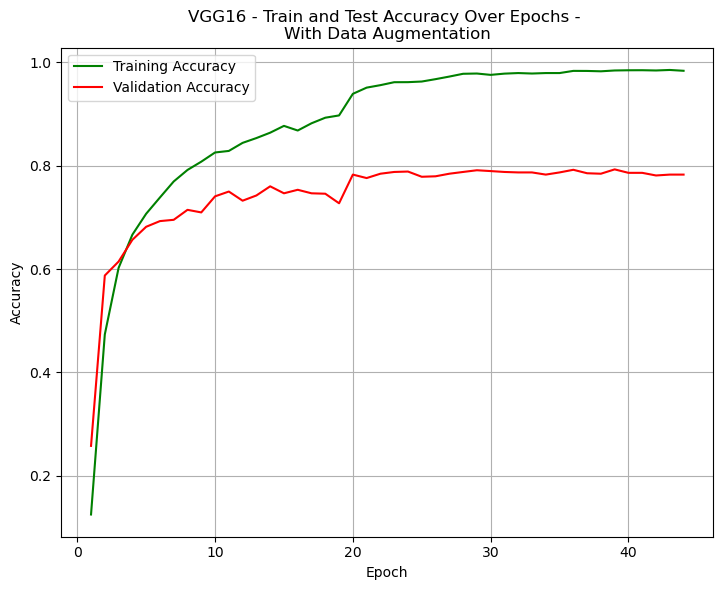

In [25]:
import pandas as pd
import matplotlib.pyplot as plt

# Define the data
data = {
    'Epoch': list(range(1, 45)),
   
    'Training Accuracy': [
        0.1250, 0.4735, 0.6022, 0.6665, 0.7070, 0.7385, 0.7695, 0.7918, 0.8078, 0.8256,
        0.8286, 0.8442, 0.8535, 0.8639, 0.8771, 0.8681, 0.8821, 0.8929, 0.8973, 0.9391,
        0.9511, 0.9559, 0.9616, 0.9617, 0.9629, 0.9675, 0.9725, 0.9779, 0.9784, 0.9758,
        0.9782, 0.9793, 0.9784, 0.9793, 0.9793, 0.9835, 0.9834, 0.9827, 0.9843, 0.9847,
        0.9848, 0.9843, 0.9853, 0.9837
    ],
   
    'Validation Accuracy': [
        0.2578, 0.5875, 0.6145, 0.6566, 0.6818, 0.6928, 0.6953, 0.7146, 
        0.7096, 0.7407, 0.7500, 0.7323, 0.7424, 0.7601, 0.7466, 0.7534, 
        0.7466, 0.7458, 0.7273, 0.7828, 0.7761, 0.7845, 0.7879, 0.7887, 
        0.7786, 0.7795, 0.7845, 0.7879, 0.7912, 0.7896, 0.7879, 0.7870, 
        0.7870, 0.7828, 0.7870, 0.7921, 0.7854, 0.7845, 0.7929, 0.7862, 
        0.7862, 0.7811, 0.7828, 0.7828
    ]
}

# Create DataFrame
df = pd.DataFrame(data)

# Plot Loss and Accuracy
plt.figure(figsize=(14, 6))

# Plot Accuracy
plt.subplot(1, 2, 2)
plt.plot(df['Epoch'], df['Training Accuracy'], label='Training Accuracy', color='green')
plt.plot(df['Epoch'], df['Validation Accuracy'], label='Validation Accuracy', color='red')
plt.title('VGG16 - Train and Test Accuracy Over Epochs - \nWith Data Augmentation')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()


38/38 - 1s - loss: 0.8628 - accuracy: 0.7828 - 818ms/epoch - 22ms/step

Test accuracy: 0.7828282713890076
38/38 [==============================] - 1s 19ms/step
               precision    recall  f1-score   support

    cardboard       0.74      0.79      0.76       107
food_organics       0.87      0.86      0.87       116
        glass       0.88      0.84      0.86        97
        metal       0.80      0.75      0.78       212
   misc_Trash       0.62      0.57      0.60       110
        paper       0.72      0.81      0.76       130
      plastic       0.76      0.81      0.78       233
      textile       0.75      0.67      0.70        84
   vegetation       0.95      0.95      0.95        99

     accuracy                           0.78      1188
    macro avg       0.79      0.78      0.78      1188
 weighted avg       0.78      0.78      0.78      1188



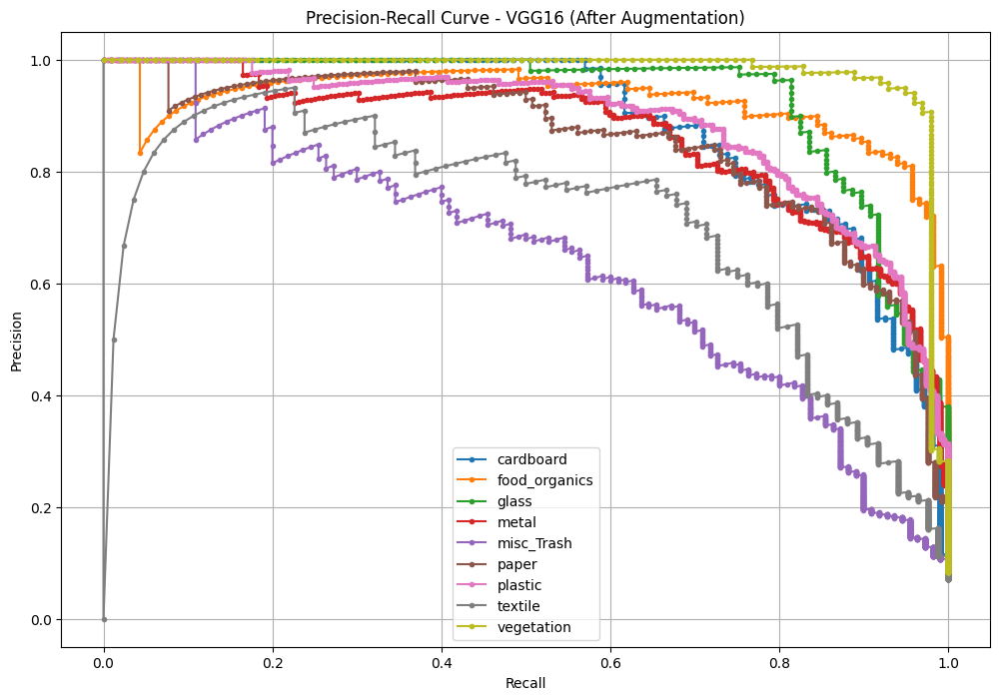

In [34]:
# Evaluate the model
test_loss, test_acc = model.evaluate(X_test_scaled, y_test, verbose=2)
print(f'\nTest accuracy: {test_acc}')

import matplotlib.pyplot as plt
from sklearn.metrics import classification_report, precision_recall_curve
import numpy as np

# Predict classes for the test set
y_pred = model.predict(X_test_scaled)
y_pred_classes = np.argmax(y_pred, axis=1)  # Convert probabilities to class labels

# Generate classification report
class_names = list(waste_image_labels.keys())  # Get class names from the dictionary
report = classification_report(y_test, y_pred_classes, target_names=class_names)
print(report)

# Generate precision-recall curve for each class
plt.figure(figsize=(12, 8))
for i, class_name in enumerate(class_names):
    precision, recall, _ = precision_recall_curve(y_test == i, y_pred[:, i])
    plt.plot(recall, precision, marker='.', label=class_name)

plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve - VGG16 (After Augmentation)')
plt.legend(loc='best')
plt.grid(True)
plt.show()


## ResNet50 Model After Augmentation

In [39]:
# code sourced from https://stackoverflow.com/questions/67701192/transfer-learning-with-resnet50-for-image-classification
from tensorflow.keras.applications import ResNet50


input_shape = (80, 80, 3)  
base_model = ResNet50(weights='imagenet', include_top=False, input_shape=input_shape)

# Unfreeze the top layers of ResNet50 for fine-tuning
for layer in base_model.layers[-6:]:  
    layer.trainable = True

model = Sequential([
    base_model,
    layers.GlobalAveragePooling2D(),  
    layers.Dense(256, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(0.001)),
    layers.Dropout(0.5),
    layers.Dense(len(waste_image_labels), activation='softmax')
])

# Compile the model
model.compile(optimizer='adam',
              loss='sparse_categorical_crossentropy',  
              metrics=['accuracy'])


In [40]:
# Train the model with callbacks
model.fit(X_train_scaled, y_train_augmented, epochs=100, validation_data=(X_test_scaled, y_test),
          callbacks=[early_stopping, reduce_lr])

Epoch 1/100
194/194 [==============================] - 33s 73ms/step - loss: 1.8707 - accuracy: 0.5417 - val_loss: 4.2048 - val_accuracy: 0.0901 - lr: 0.0010
Epoch 2/100
194/194 [==============================] - 13s 68ms/step - loss: 1.2036 - accuracy: 0.7070 - val_loss: 7.8212 - val_accuracy: 0.0816 - lr: 0.0010
Epoch 3/100
194/194 [==============================] - 13s 68ms/step - loss: 0.9702 - accuracy: 0.7649 - val_loss: 4.2256 - val_accuracy: 0.0909 - lr: 0.0010
Epoch 4/100
194/194 [==============================] - 13s 69ms/step - loss: 0.7255 - accuracy: 0.8224 - val_loss: 3.3908 - val_accuracy: 0.2138 - lr: 0.0010
Epoch 5/100
194/194 [==============================] - 13s 69ms/step - loss: 0.5773 - accuracy: 0.8648 - val_loss: 2.8727 - val_accuracy: 0.4049 - lr: 0.0010
Epoch 6/100
194/194 [==============================] - 13s 69ms/step - loss: 0.4961 - accuracy: 0.8819 - val_loss: 1.6631 - val_accuracy: 0.5842 - lr: 0.0010
Epoch 7/100
194/194 [==============================]

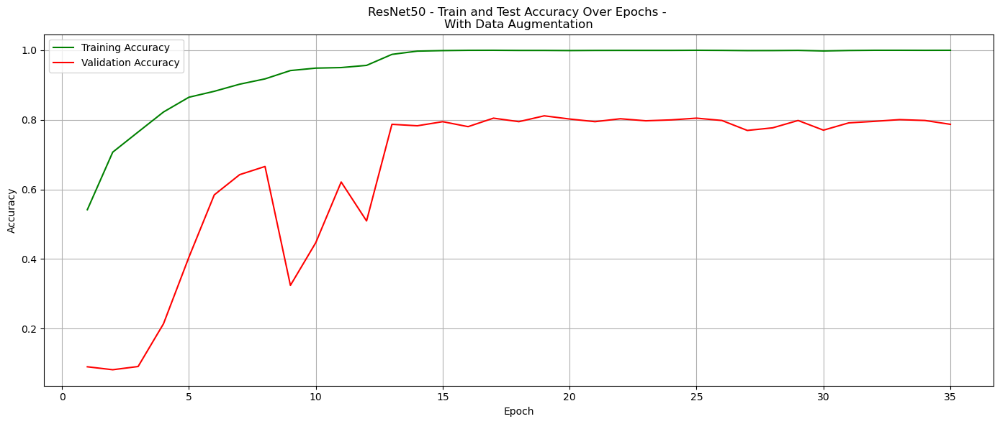

In [35]:
import pandas as pd
import matplotlib.pyplot as plt

data = {
    'Epoch': list(range(1, 36)),  
    'Training Accuracy': [
        0.5417, 0.7070, 0.7649, 0.8224, 0.8648, 0.8819, 0.9023, 0.9176,
        0.9415, 0.9485, 0.9501, 0.9564, 0.9880, 0.9974, 0.9989, 0.9997,
        0.9998, 0.9994, 0.9994, 0.9990, 0.9994, 0.9995, 0.9995, 0.9995,
        0.9998, 0.9995, 0.9989, 0.9990, 0.9995, 0.9979, 0.9992, 0.9998,
        0.9998, 0.9997, 0.9998
    ],
    'Validation Accuracy': [
        0.0901, 0.0816, 0.0909, 0.2138, 0.4049, 0.5842, 0.6423, 0.6658,
        0.3241, 0.4470, 0.6212, 0.5093, 0.7870, 0.7828, 0.7946, 0.7803,
        0.8047, 0.7946, 0.8114, 0.8022, 0.7946, 0.8030, 0.7971, 0.7997,
        0.8047, 0.7980, 0.7694, 0.7769, 0.7980, 0.7702, 0.7912, 0.7955,
        0.8005, 0.7980, 0.7870
    ]
}

# Create DataFrame
df = pd.DataFrame(data)

# Plotting
plt.figure(figsize=(14, 6))

# Plot Accuracy
plt.plot(df['Epoch'], df['Training Accuracy'], label='Training Accuracy', color='green')
plt.plot(df['Epoch'], df['Validation Accuracy'], label='Validation Accuracy', color='red')
plt.title('ResNet50 - Train and Test Accuracy Over Epochs - \nWith Data Augmentation')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.grid(True)

# Adjust layout
plt.tight_layout()

# Show the plot
plt.show()


38/38 - 1s - loss: 0.8251 - accuracy: 0.8047 - 780ms/epoch - 21ms/step

Test accuracy: 0.804713785648346
38/38 [==============================] - 1s 17ms/step
               precision    recall  f1-score   support

    cardboard       0.74      0.84      0.79       107
food_organics       0.90      0.79      0.84       116
        glass       0.89      0.87      0.88        97
        metal       0.79      0.84      0.81       212
   misc_Trash       0.66      0.63      0.64       110
        paper       0.86      0.78      0.82       130
      plastic       0.81      0.83      0.82       233
      textile       0.71      0.65      0.68        84
   vegetation       0.88      0.95      0.91        99

     accuracy                           0.80      1188
    macro avg       0.80      0.80      0.80      1188
 weighted avg       0.81      0.80      0.80      1188



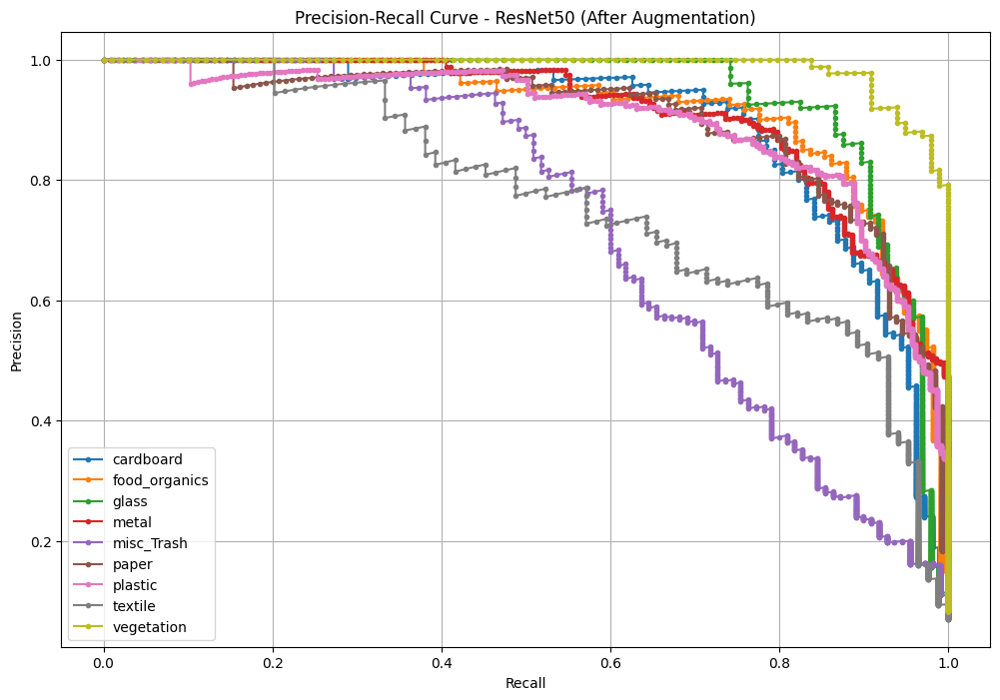

In [41]:
# Evaluate the model
test_loss, test_acc = model.evaluate(X_test_scaled, y_test, verbose=2)
print(f'\nTest accuracy: {test_acc}')

import matplotlib.pyplot as plt
from sklearn.metrics import classification_report, precision_recall_curve
import numpy as np

# Predict classes for the test set
y_pred = model.predict(X_test_scaled)
y_pred_classes = np.argmax(y_pred, axis=1)  # Convert probabilities to class labels

# Generate classification report
class_names = list(waste_image_labels.keys())  # Get class names from the dictionary
report = classification_report(y_test, y_pred_classes, target_names=class_names)
print(report)

# Generate precision-recall curve for each class
plt.figure(figsize=(12, 8))
for i, class_name in enumerate(class_names):
    precision, recall, _ = precision_recall_curve(y_test == i, y_pred[:, i])
    plt.plot(recall, precision, marker='.', label=class_name)

plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve - ResNet50 (After Augmentation)')
plt.legend(loc='best')
plt.grid(True)
plt.show()


## MobileNetV2 Model After Augmentation

In [66]:
#code sourced from https://www.tensorflow.org/api_docs/python/tf/keras/applications/MobileNetV2
from tensorflow.keras.applications import MobileNetV2

# Define the model using MobileNetV2 with some trainable layers
input_shape = (80, 80, 3)  
base_model = MobileNetV2(weights='imagenet', include_top=False, input_shape=input_shape)

# Unfreeze the top layers of MobileNetV2 for fine-tuning
for layer in base_model.layers[-6:]: 
    layer.trainable = True

model = Sequential([
    base_model,
    layers.GlobalAveragePooling2D(),  
    layers.Dense(256, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(0.001)),
    layers.Dropout(0.5),
    layers.Dense(len(waste_image_labels), activation='softmax')
])

# Compile the model
model.compile(optimizer='adam',
              loss='sparse_categorical_crossentropy',  
              metrics=['accuracy'])


In [67]:
# Train the model with callbacks
model.fit(X_train_scaled, y_train_augmented, epochs=100, validation_data=(X_test_scaled, y_test),
          callbacks=[early_stopping, reduce_lr])

Epoch 1/100
207/207 [==============================] - 21s 34ms/step - loss: 1.7943 - accuracy: 0.5457 - val_loss: 4.7684 - val_accuracy: 0.2334 - lr: 0.0010
Epoch 2/100
207/207 [==============================] - 6s 28ms/step - loss: 1.1813 - accuracy: 0.7182 - val_loss: 2.7522 - val_accuracy: 0.3817 - lr: 0.0010
Epoch 3/100
207/207 [==============================] - 6s 28ms/step - loss: 0.9175 - accuracy: 0.7820 - val_loss: 5.9405 - val_accuracy: 0.2513 - lr: 0.0010
Epoch 4/100
207/207 [==============================] - 6s 29ms/step - loss: 0.7681 - accuracy: 0.8148 - val_loss: 9.6110 - val_accuracy: 0.2040 - lr: 0.0010
Epoch 5/100
207/207 [==============================] - 6s 28ms/step - loss: 0.6403 - accuracy: 0.8458 - val_loss: 8.8038 - val_accuracy: 0.2124 - lr: 0.0010
Epoch 6/100
207/207 [==============================] - 6s 28ms/step - loss: 0.5551 - accuracy: 0.8639 - val_loss: 6.9253 - val_accuracy: 0.2713 - lr: 0.0010
Epoch 7/100
207/207 [==============================] - 6s

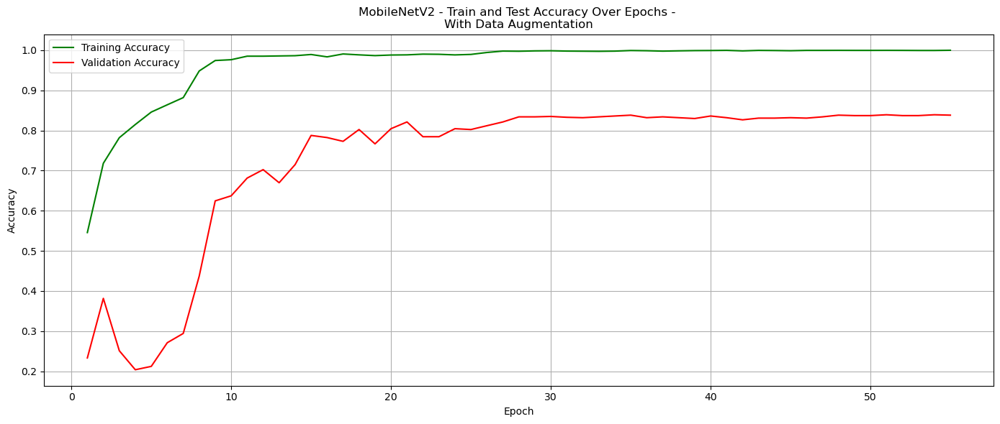

In [36]:
import pandas as pd
import matplotlib.pyplot as plt

# Define the data from the training log
data = {
    'Epoch': list(range(1, 56)),  # Number of epochs in your log
    'Training Accuracy': [
        0.5457, 0.7182, 0.7820, 0.8148, 0.8458, 0.8639, 0.8818, 0.9482,
        0.9742, 0.9762, 0.9850, 0.9850, 0.9856, 0.9862, 0.9892, 0.9833,
        0.9905, 0.9883, 0.9864, 0.9879, 0.9883, 0.9901, 0.9897, 0.9882,
        0.9894, 0.9942, 0.9977, 0.9973, 0.9982, 0.9985, 0.9977, 0.9974,
        0.9971, 0.9976, 0.9991, 0.9986, 0.9976, 0.9983, 0.9989, 0.9991,
        0.9995, 0.9982, 0.9994, 0.9991, 0.9986, 0.9994, 0.9994, 0.9995,
        0.9994, 0.9994, 0.9995, 0.9994, 0.9992, 0.9992, 0.9997
    ],
    'Validation Accuracy': [
        0.2334, 0.3817, 0.2513, 0.2040, 0.2124, 0.2713, 0.2944, 0.4374,
        0.6246, 0.6372, 0.6814, 0.7024, 0.6698, 0.7150, 0.7876, 0.7823,
        0.7729, 0.8023, 0.7666, 0.8044, 0.8212, 0.7844, 0.7844, 0.8044,
        0.8023, 0.8118, 0.8212, 0.8339, 0.8339, 0.8349, 0.8328, 0.8318,
        0.8339, 0.8360, 0.8381, 0.8318, 0.8339, 0.8318, 0.8297, 0.8360,
        0.8318, 0.8265, 0.8307, 0.8307, 0.8318, 0.8307, 0.8339, 0.8381,
        0.8370, 0.8370, 0.8391, 0.8370, 0.8370, 0.8391, 0.8381
    ]
}


# Create DataFrame
df = pd.DataFrame(data)

# Plotting
plt.figure(figsize=(14, 6))

# Plot Accuracy
plt.plot(df['Epoch'], df['Training Accuracy'], label='Training Accuracy', color='green')
plt.plot(df['Epoch'], df['Validation Accuracy'], label='Validation Accuracy', color='red')
plt.title('MobileNetV2 - Train and Test Accuracy Over Epochs - \nWith Data Augmentation')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.grid(True)

# Adjust layout
plt.tight_layout()

# Show the plot
plt.show()


30/30 - 0s - loss: 0.8272 - accuracy: 0.8318 - 288ms/epoch - 10ms/step

Test accuracy: 0.831756055355072
30/30 [==============================] - 1s 7ms/step
               precision    recall  f1-score   support

    cardboard       0.79      0.89      0.84        90
food_organics       0.83      0.83      0.83        89
        glass       0.88      0.86      0.87        84
        metal       0.83      0.84      0.83       159
   misc_Trash       0.71      0.70      0.71        93
        paper       0.86      0.86      0.86       104
      plastic       0.86      0.80      0.83       188
      textile       0.79      0.77      0.78        64
   vegetation       0.90      0.96      0.93        80

     accuracy                           0.83       951
    macro avg       0.83      0.83      0.83       951
 weighted avg       0.83      0.83      0.83       951



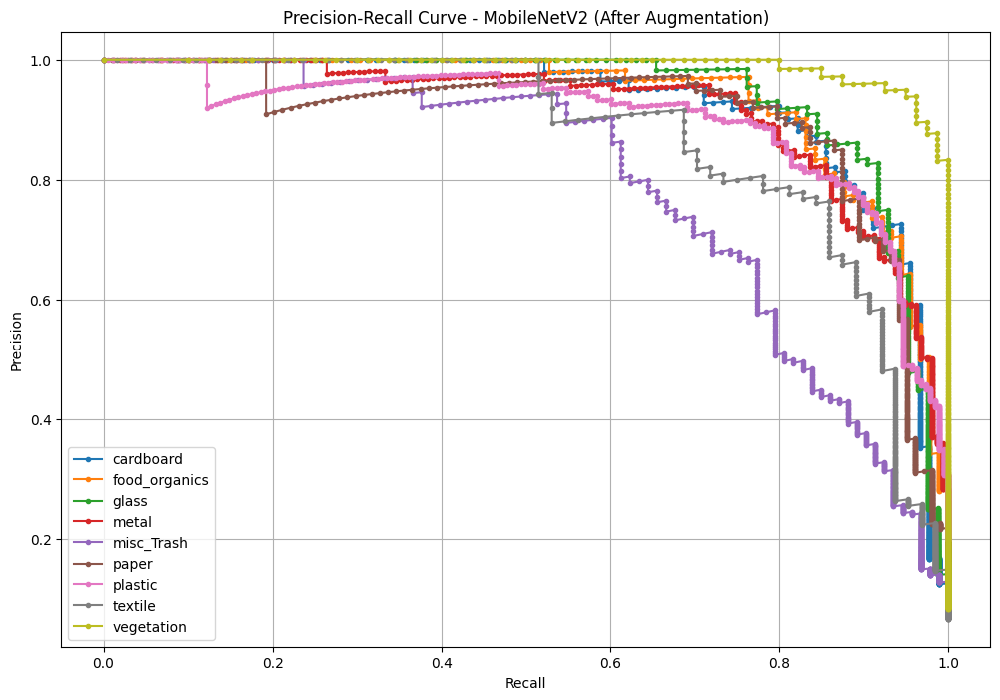

In [68]:
# Evaluate the model
test_loss, test_acc = model.evaluate(X_test_scaled, y_test, verbose=2)
print(f'\nTest accuracy: {test_acc}')

import matplotlib.pyplot as plt
from sklearn.metrics import classification_report, precision_recall_curve
import numpy as np

# Assuming y_test and y_pred_classes are already defined
# If not, make sure to define them correctly based on your dataset and model

# Predict classes for the test set
y_pred = model.predict(X_test_scaled)
y_pred_classes = np.argmax(y_pred, axis=1)  # Convert probabilities to class labels

# Generate classification report
class_names = list(waste_image_labels.keys())  # Get class names from the dictionary
report = classification_report(y_test, y_pred_classes, target_names=class_names)
print(report)

# Generate precision-recall curve for each class
plt.figure(figsize=(12, 8))
for i, class_name in enumerate(class_names):
    precision, recall, _ = precision_recall_curve(y_test == i, y_pred[:, i])
    plt.plot(recall, precision, marker='.', label=class_name)

plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve - MobileNetV2 (After Augmentation)')
plt.legend(loc='best')
plt.grid(True)
plt.show()


## Inception V3 Model After Augmentation

In [31]:
# code sourced from 
# https://medium.com/@armielynobinguar/simple-implementation-of-inceptionv3-for-image-classification-using-tensorflow-and-keras-6557feb9bf53

from tensorflow.keras.applications import InceptionV3

# Define the model using InceptionV3 with some trainable layers
input_shape = (80, 80, 3)  
base_model = InceptionV3(weights='imagenet', include_top=False, input_shape=input_shape)

# Unfreeze the top layers of InceptionV3 for fine-tuning
for layer in base_model.layers[-6:]: 
    layer.trainable = True

model = Sequential([
    base_model,
    layers.GlobalAveragePooling2D(),  
    layers.Dense(256, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(0.001)),
    layers.Dropout(0.5),
    layers.Dense(len(waste_image_labels), activation='softmax')
])

# Compile the model
model.compile(optimizer='adam',
              loss='sparse_categorical_crossentropy',  
              metrics=['accuracy'])

In [32]:
# Train the model with callbacks
model.fit(X_train_scaled, y_train_augmented, epochs=100, validation_data=(X_test_scaled, y_test),
          callbacks=[early_stopping, reduce_lr])


Epoch 1/100


2024-07-27 02:02:39.375050: I tensorflow/compiler/xla/stream_executor/cuda/cuda_dnn.cc:428] Loaded cuDNN version 8907
2024-07-27 02:02:45.887288: W tensorflow/compiler/xla/stream_executor/gpu/asm_compiler.cc:115] *** WARNING *** You are using ptxas 10.1.243, which is older than 11.1. ptxas before 11.1 is known to miscompile XLA code, leading to incorrect results or invalid-address errors.

You may not need to update to CUDA 11.1; cherry-picking the ptxas binary is often sufficient.
2024-07-27 02:02:51.385960: I tensorflow/compiler/xla/service/service.cc:173] XLA service 0x564c15017c00 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
2024-07-27 02:02:51.386038: I tensorflow/compiler/xla/service/service.cc:181]   StreamExecutor device (0): NVIDIA GeForce RTX 2060, Compute Capability 7.5
2024-07-27 02:02:51.965265: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:268] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DI

  3/207 [..............................] - ETA: 11s - loss: 2.9068 - accuracy: 0.1250   

2024-07-27 02:03:13.004457: W tensorflow/compiler/xla/stream_executor/gpu/asm_compiler.cc:115] *** WARNING *** You are using ptxas 10.1.243, which is older than 11.1. ptxas before 11.1 is known to miscompile XLA code, leading to incorrect results or invalid-address errors.

You may not need to update to CUDA 11.1; cherry-picking the ptxas binary is often sufficient.


207/207 [==============================] - 59s 59ms/step - loss: 2.3054 - accuracy: 0.2886 - val_loss: 9.0330 - val_accuracy: 0.0957 - lr: 0.0010
Epoch 2/100
207/207 [==============================] - 9s 44ms/step - loss: 1.8028 - accuracy: 0.4308 - val_loss: 135.5160 - val_accuracy: 0.1746 - lr: 0.0010
Epoch 3/100
207/207 [==============================] - 9s 44ms/step - loss: 1.4757 - accuracy: 0.5395 - val_loss: 2.0381 - val_accuracy: 0.5426 - lr: 0.0010
Epoch 4/100
207/207 [==============================] - 9s 44ms/step - loss: 1.2991 - accuracy: 0.5904 - val_loss: 2.3049 - val_accuracy: 0.3733 - lr: 0.0010
Epoch 5/100
207/207 [==============================] - 9s 44ms/step - loss: 1.1523 - accuracy: 0.6497 - val_loss: 1.5673 - val_accuracy: 0.5174 - lr: 0.0010
Epoch 6/100
207/207 [==============================] - 9s 44ms/step - loss: 1.2917 - accuracy: 0.5950 - val_loss: 3.7365 - val_accuracy: 0.3218 - lr: 0.0010
Epoch 7/100
207/207 [==============================] - 9s 44ms/step

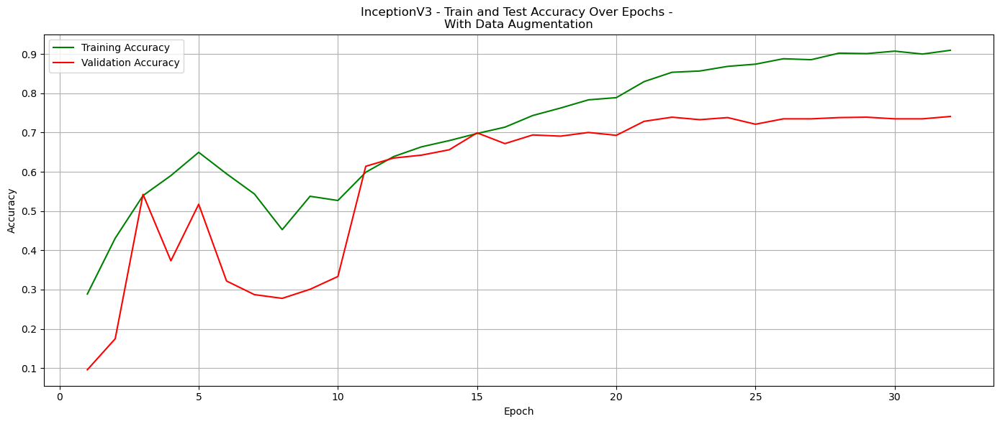

In [39]:
import pandas as pd
import matplotlib.pyplot as plt

# Define the data from the training log
data = {
    'Epoch': list(range(1, 33)),
    'Training Accuracy': [
        0.2886, 0.4308, 0.5395, 0.5904, 0.6497, 0.5950, 0.5436, 0.4526,
        0.5377, 0.5269, 0.5989, 0.6388, 0.6636, 0.6796, 0.6977, 0.7138,
        0.7435, 0.7626, 0.7834, 0.7890, 0.8299, 0.8536, 0.8569, 0.8687,
        0.8743, 0.8881, 0.8857, 0.9024, 0.9013, 0.9075, 0.9001, 0.9097
    ],
    'Validation Accuracy': [
        0.0957, 0.1746, 0.5426, 0.3733, 0.5174, 0.3218, 0.2871, 0.2776,
        0.3007, 0.3333, 0.6141, 0.6351, 0.6425, 0.6562, 0.6993, 0.6719,
        0.6940, 0.6909, 0.7003, 0.6930, 0.7287, 0.7392, 0.7329, 0.7382,
        0.7213, 0.7350, 0.7350, 0.7382, 0.7392, 0.7350, 0.7350, 0.7411
    ]
}


# Create DataFrame
df = pd.DataFrame(data)

# Plotting
plt.figure(figsize=(14, 6))

# Plot Accuracy
plt.plot(df['Epoch'], df['Training Accuracy'], label='Training Accuracy', color='green')
plt.plot(df['Epoch'], df['Validation Accuracy'], label='Validation Accuracy', color='red')
plt.title('InceptionV3 - Train and Test Accuracy Over Epochs - \nWith Data Augmentation')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.grid(True)

# Adjust layout
plt.tight_layout()

# Show the plot
plt.show()


30/30 - 0s - loss: 0.8603 - accuracy: 0.7392 - 439ms/epoch - 15ms/step

Test accuracy: 0.7392218708992004
30/30 [==============================] - 1s 11ms/step
               precision    recall  f1-score   support

    cardboard       0.69      0.80      0.74        90
food_organics       0.84      0.85      0.85        89
        glass       0.88      0.79      0.83        84
        metal       0.73      0.69      0.71       159
   misc_Trash       0.50      0.63      0.56        93
        paper       0.70      0.73      0.72       104
      plastic       0.86      0.68      0.76       188
      textile       0.55      0.69      0.61        64
   vegetation       0.94      0.93      0.93        80

     accuracy                           0.74       951
    macro avg       0.74      0.75      0.74       951
 weighted avg       0.76      0.74      0.74       951



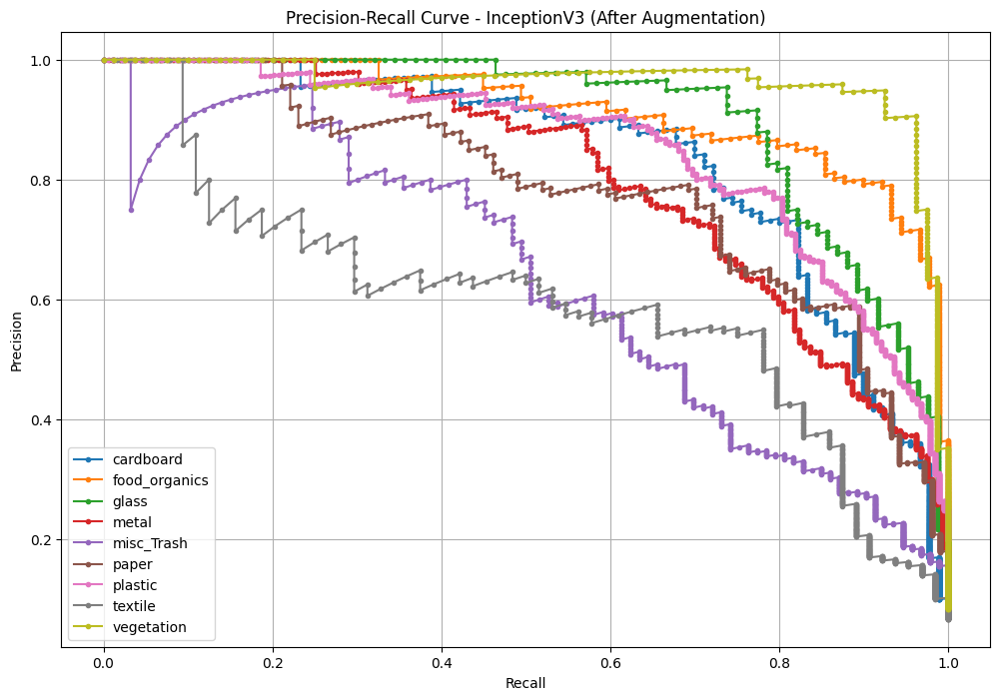

In [33]:
# Evaluate the model
test_loss, test_acc = model.evaluate(X_test_scaled, y_test, verbose=2)
print(f'\nTest accuracy: {test_acc}')


import matplotlib.pyplot as plt
from sklearn.metrics import classification_report, precision_recall_curve
import numpy as np

# Assuming y_test and y_pred_classes are already defined
# If not, make sure to define them correctly based on your dataset and model

# Predict classes for the test set
y_pred = model.predict(X_test_scaled)
y_pred_classes = np.argmax(y_pred, axis=1)  # Convert probabilities to class labels

# Generate classification report
class_names = list(waste_image_labels.keys())  # Get class names from the dictionary
report = classification_report(y_test, y_pred_classes, target_names=class_names)
print(report)

# Generate precision-recall curve for each class
plt.figure(figsize=(12, 8))
for i, class_name in enumerate(class_names):
    precision, recall, _ = precision_recall_curve(y_test == i, y_pred[:, i])
    plt.plot(recall, precision, marker='.', label=class_name)

plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve - InceptionV3 (After Augmentation)')
plt.legend(loc='best')
plt.grid(True)
plt.show()
